In [ ]:
!pip install arch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 916.4/916.4 kB 14.7 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import warnings
import statsmodels.graphics.tsaplots
import torch as tc
import arch
from arch import arch_model
from arch.univariate import FIGARCH
from arch.univariate import ConstantMean, ZeroMean, FIGARCH, Normal
# import yfinance as yf
# from yahoofinancials import YahooFinancials
# import yahoo_finance as yf
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_predict
from statsmodels.graphics.gofplots import qqplot, qqline
from statsmodels.stats.stattools import jarque_bera
from statsmodels.stats.diagnostic import acorr_ljungbox, acorr_lm
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
import random
# Importing the Keras libraries and packages
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
import torch
import torch.nn as nn
from torch import nn
from torch.autograd import Variable

warnings.filterwarnings('ignore')
plt.style.use('seaborn')
plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [12, 6]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
imoex_daily = pd.read_csv('IMOEX.ME.csv').round(2)
imoex_daily.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2013-04-29,1363.38,1363.59,1361.89,1363.10,1363.10,0.0
1,2013-04-30,1385.88,1386.69,1384.41,1386.69,1386.69,0.0
2,2013-05-02,1377.45,1382.54,1377.14,1382.13,1382.13,0.0
3,2013-05-03,1408.03,1409.38,1406.84,1409.38,1409.38,0.0
4,2013-05-06,1413.02,1414.02,1411.91,1413.96,1413.96,0.0


In [ ]:
lukoil_daily = pd.read_csv('LKOH Historical Data.csv').round(2)
rosneft_daily = pd.read_csv('ROSN Historical Data.csv').round(2)
sber_daily = pd.read_csv('SBER Historical Data.csv').round(2)
yandex_daily = pd.read_csv('YNDX.csv').round(2)

In [ ]:
lukoil_daily['Change %'] = [float(str[:-1])/100 + 1 for str in lukoil_daily['Change %']]
lukoil_daily = lukoil_daily.set_index("Date")
lukoil_daily.index = pd.DatetimeIndex(lukoil_daily.index)
lukoil_daily['log_returns'] = np.log(lukoil_daily['Change %'])
returns_lukoil = lukoil_daily['log_returns'] * 100

In [ ]:
lukoil_daily

,Price,Open,High,Low,Vol.,Change %,log_returns
Date,,,,,,,
2023-03-31,"4,352.5","4,379.0","4,389.0","4,280.5",675.59K,0.9932,-0.006823
2023-03-30,"4,382.5","4,349.5","4,388.5","4,320.0",440.24K,1.0093,0.009257
2023-03-29,"4,342.0","4,323.0","4,360.0","4,294.0",421.82K,1.0051,0.005087
2023-03-28,"4,320.0","4,331.0","4,350.5","4,271.0",490.57K,0.9995,-0.000500
2023-03-27,"4,322.0","4,230.0","4,343.5","4,217.0",586.53K,1.0275,0.027129
...,...,...,...,...,...,...,...
2013-04-05,"1,935.6","1,963.8","1,977.0","1,933.3",1.29M,0.9837,-0.016434
2013-04-04,"1,967.6","1,964.6","1,983.7","1,958.2",727.08K,0.9968,-0.003205
2013-04-03,"1,973.9","1,989.8","2,001.7","1,972.5",756.90K,0.9917,-0.008335


In [ ]:
# ============================= Preprocessing =================================== #
imoex_daily = imoex_daily.set_index("Date")
imoex_daily.index = pd.DatetimeIndex(imoex_daily.index)
imoex_daily['log_returns'] = np.log(imoex_daily['Adj Close']).diff()
#со скользящим средним
imoex_daily['stdev'] = imoex_daily['log_returns'].rolling(window=21).std()
imoex_daily['Volatility'] = imoex_daily['stdev'] * (252**0.5) # Annualize
imoex_daily['log_returns'] = imoex_daily['log_returns'] * 100
imoex_daily = imoex_daily.dropna()

<Axes: xlabel='Date'>

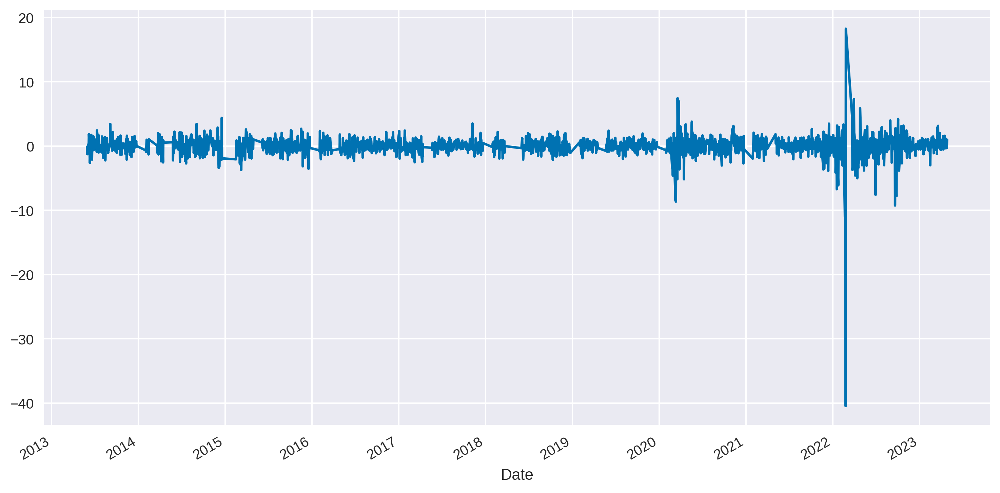

In [ ]:
imoex_daily['log_returns'].plot()

<Axes: xlabel='Date'>

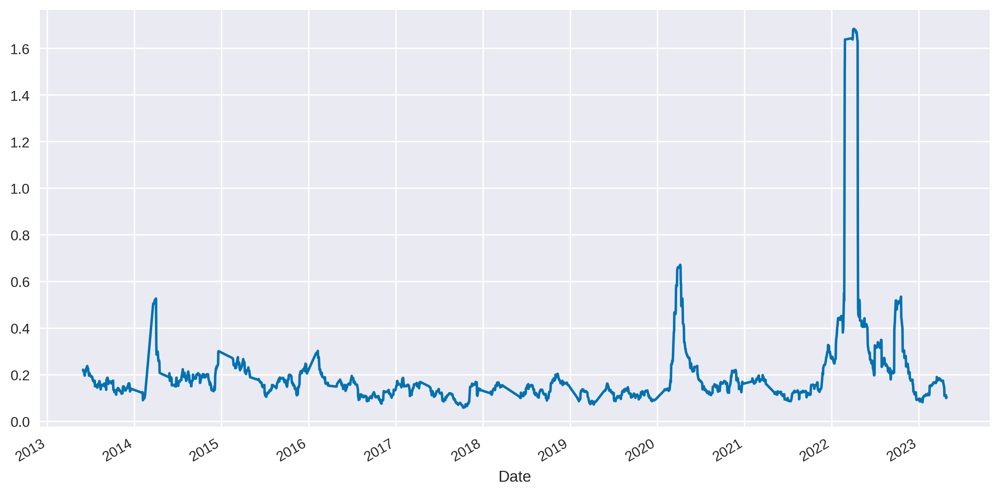

In [ ]:
imoex_daily['Volatility'].plot()

In [ ]:
lukoil_daily['stdev'] = lukoil_daily['log_returns'].rolling(window=30, center=False).std()
lukoil_daily['Volatility'] = lukoil_daily['stdev'] * (252**0.5) # Annualize.
lukoil_daily = lukoil_daily.dropna()
vol_lukoil = lukoil_daily["Volatility"]

In [ ]:
# Split the data into training, validation, and test sets
train_size = int(len(imoex_daily) * 0.7)
test_size = len(imoex_daily) - train_size
train_data, test_data = imoex_daily[0:train_size], imoex_daily[train_size:]

# Define the hyperparameters to tune
p_values = [1, 2, 3]
o_values = [0, 1]
q_values = [1, 2, 3]

# Use TimeSeriesSplit to create training and validation sets
tscv = TimeSeriesSplit(n_splits = 5)

for p in p_values:
  for o in o_values:
    for q in q_values:
      rmse = []
      for train_index, test_index in tscv.split(train_data):
        cv_train, cv_test = train_data.iloc[train_index], train_data.iloc[test_index]
        model = arch_model(cv_train['log_returns'], mean='Zero', vol='GARCH', p=p, o=o, q=q)
        model_fitted = model.fit(disp='off')
        forecast = model_fitted.forecast(horizon=len(cv_test))
        rmse_one = np.sqrt(mean_squared_error(cv_test['Volatility'], np.sqrt(forecast.variance.iloc[-1, :]*252)/100))
        rmse.append(rmse_one)
      res = np.mean(rmse)
      print('p:', p, 'o:', o, 'q:', q, 'RMSE:', res)

p: 1 o: 0 q: 1 RMSE: 0.06991168146797555
p: 1 o: 0 q: 2 RMSE: 0.06976471102686706
p: 1 o: 0 q: 3 RMSE: 0.06989802669864618
p: 1 o: 1 q: 1 RMSE: 0.0701228459316425
p: 1 o: 1 q: 2 RMSE: 0.06990042185093034
p: 1 o: 1 q: 3 RMSE: 0.07018977980787222
p: 2 o: 0 q: 1 RMSE: 0.0699407934647007
p: 2 o: 0 q: 2 RMSE: 0.06990577231945394
p: 2 o: 0 q: 3 RMSE: 0.06986399847712879
p: 2 o: 1 q: 1 RMSE: 0.07012306885478518
p: 2 o: 1 q: 2 RMSE: 0.06991715747411045
p: 2 o: 1 q: 3 RMSE: 0.07020544927972769
p: 3 o: 0 q: 1 RMSE: 0.06993527623181625
p: 3 o: 0 q: 2 RMSE: 0.06992517635032189
p: 3 o: 0 q: 3 RMSE: 0.0698689469545831
p: 3 o: 1 q: 1 RMSE: 0.07012303527970591
p: 3 o: 1 q: 2 RMSE: 0.06991687460383789
p: 3 o: 1 q: 3 RMSE: 0.06991485971748843


In [ ]:
def rolling_predictions(train, test, p, o, q):
  rolling_predictions = []
  size = len(test)

  for i in range(size):
    train_log = train['log_returns'][:-(size-i)]
    model = arch_model(train_log, mean='Zero', vol='GARCH',
                   p=p, o=o, q=q)
    model_fitted = model.fit(disp='off')
    pred = model_fitted.forecast(horizon=1)
    rolling_predictions.append(np.sqrt(pred.variance.values[-1,:][0]))

  return pd.Series(rolling_predictions, index=test['log_returns'].index[-size:])

In [ ]:
# Split the data into training, validation, and test sets
train_size = int(len(imoex_daily) * 0.7)
test_size = len(imoex_daily) - train_size
train_data, test_data = imoex_daily[0:train_size], imoex_daily[train_size:]

# Define the hyperparameters to tune
p_values = [1, 2, 3]
o_values = [0, 1]
q_values = [1, 2, 3]

# Use TimeSeriesSplit to create training and validation sets
tscv = TimeSeriesSplit(n_splits = 5)

for p in p_values:
  for o in o_values:
    for q in q_values:
      rmse = []
      for train_index, test_index in tscv.split(train_data):
        cv_train, cv_test = train_data.iloc[train_index], train_data.iloc[test_index]
        forecast = rolling_predictions(cv_train, cv_test, p, o, q)
        rmse_one = np.sqrt(mean_squared_error(cv_test['Volatility'], np.sqrt(forecast*252)/100))
        rmse.append(rmse_one)
      res = np.mean(rmse)
      print('p:', p, 'o:', o, 'q:', q, 'RMSE:', res)

p: 1 o: 0 q: 1 RMSE: 0.06592176451731736
p: 1 o: 0 q: 2 RMSE: 0.06574493041775906
p: 1 o: 0 q: 3 RMSE: 0.06601290409635865
p: 1 o: 1 q: 1 RMSE: 0.06575552017633998
p: 1 o: 1 q: 2 RMSE: 0.06608624371261854
p: 1 o: 1 q: 3 RMSE: 0.06672869050706998
p: 2 o: 0 q: 1 RMSE: 0.06593958662061486
p: 2 o: 0 q: 2 RMSE: 0.06583386663242603
p: 2 o: 0 q: 3 RMSE: 0.06595718022362555
p: 2 o: 1 q: 1 RMSE: 0.0659367933644945
p: 2 o: 1 q: 2 RMSE: 0.06629075869812373
p: 2 o: 1 q: 3 RMSE: 0.06659555549098452
p: 3 o: 0 q: 1 RMSE: 0.06673183253291227
p: 3 o: 0 q: 2 RMSE: 0.0661341367024278
p: 3 o: 0 q: 3 RMSE: 0.06635941993791368
p: 3 o: 1 q: 1 RMSE: 0.06595053958091535
p: 3 o: 1 q: 2 RMSE: 0.06634846336182318
p: 3 o: 1 q: 3 RMSE: 0.06674462079639244


In [ ]:
forecast = rolling_predictions(train_data, test_data, p=1, o=0, q=2)
print('RMSE:', np.sqrt(mean_squared_error(test_data['Volatility'], np.sqrt(forecast*252)/100)))

RMSE: 0.30706752328812076


In [ ]:
model = arch_model(train_data['log_returns'], mean='Zero', vol='GARCH',
                   p=1, o=0, q=2)
model_fitted = model.fit(disp='off')
print(model_fitted.summary())

                       Zero Mean - GARCH Model Results                        
Dep. Variable:            log_returns   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.001
Vol Model:                      GARCH   Log-Likelihood:               -2067.63
Distribution:                  Normal   AIC:                           4143.26
Method:            Maximum Likelihood   BIC:                           4164.44
                                        No. Observations:                 1473
Date:                Tue, May 30 2023   Df Residuals:                     1473
Time:                        15:40:43   Df Model:                            0
                              Volatility Model                              
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega          0.0355  1.709e-02      2.079  3.765e-02 [2.

In [ ]:
imoex_daily['garch_vol'] = pd.concat([model_fitted.conditional_volatility, np.sqrt(forecast*252)/10], axis=0)
imoex_daily['garch_resid'] = imoex_daily['log_returns']

In [ ]:
forecast = rolling_predictions(train_data, test_data, p=1, o=1, q=1)
print('RMSE:', np.sqrt(mean_squared_error(test_data['Volatility'], np.sqrt(forecast*252)/100)))

RMSE: 0.3070886012904225


In [ ]:
model = arch_model(train_data['log_returns'], mean='Zero', vol='GARCH',
                   p=1, o=1, q=1)
model_fitted = model.fit(disp='off')
print(model_fitted.summary())

                     Zero Mean - GJR-GARCH Model Results                      
Dep. Variable:            log_returns   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.001
Vol Model:                  GJR-GARCH   Log-Likelihood:               -2061.22
Distribution:                  Normal   AIC:                           4130.44
Method:            Maximum Likelihood   BIC:                           4151.62
                                        No. Observations:                 1473
Date:                Tue, May 30 2023   Df Residuals:                     1473
Time:                        15:41:04   Df Model:                            0
                              Volatility Model                              
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega          0.0390  1.561e-02      2.501  1.238e-02 [8.

In [ ]:
imoex_daily['gjr_garch_vol'] = pd.concat([model_fitted.conditional_volatility, np.sqrt(forecast*252)/10], axis= 0)
imoex_daily['gjr_garch_resid'] = imoex_daily['log_returns']

In [ ]:
def rolling_predictions_egarch(train, test, p, q):
  rolling_predictions = []
  size = len(test)

  for i in range(size):
    train_log = train['log_returns'][:-(size-i)]
    model = arch_model(train_log, mean='Zero', vol='EGARCH',
                   p=p, q=q)
    model_fitted = model.fit(options={'max_iter': 10000}, disp='off')
    pred = model_fitted.forecast(horizon=1)
    rolling_predictions.append(np.sqrt(pred.variance.values[-1,:][0]))

  return pd.Series(rolling_predictions, index=test['log_returns'].index[-size:])

In [ ]:
forecast = rolling_predictions_egarch(train_data, test_data, p=1, q=1)
print('RMSE:', np.sqrt(mean_squared_error(test_data['Volatility'], np.sqrt(forecast*252)/100)))

RMSE: 0.30599897711367513


In [ ]:
model = arch_model(train_data['log_returns'], mean='Zero', vol='EGARCH',
                   p=1, q=1)
model_fitted = model.fit(disp='off')
print(model_fitted.summary())

                       Zero Mean - EGARCH Model Results                       
Dep. Variable:            log_returns   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.001
Vol Model:                     EGARCH   Log-Likelihood:               -2079.97
Distribution:                  Normal   AIC:                           4165.95
Method:            Maximum Likelihood   BIC:                           4181.83
                                        No. Observations:                 1473
Date:                Tue, May 30 2023   Df Residuals:                     1473
Time:                        15:41:18   Df Model:                            0
                               Volatility Model                              
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega      4.7182e-03  5.767e-03      0.818      0.413 

In [ ]:
imoex_daily['egarch_vol'] = pd.concat([model_fitted.conditional_volatility, np.sqrt(forecast*252)/10], axis= 0)
imoex_daily['egarch_resid'] = imoex_daily['log_returns']

In [ ]:
def rolling_predictions_tgarch(train, test, p, q):
  rolling_predictions = []
  size = len(test)

  for i in range(size):
    train_log = train['log_returns'][:-(size-i)]
    model = arch_model(train_log, mean='Zero', vol='GARCH',
                   p=p, o=1, q=q, power=1)
    model_fitted = model.fit(disp='off')
    pred = model_fitted.forecast(horizon=1)
    rolling_predictions.append(np.sqrt(pred.variance.values[-1,:][0]))

  return pd.Series(rolling_predictions, index=test['log_returns'].index[-size:])

In [ ]:
# Split the data into training, validation, and test sets
train_size = int(len(imoex_daily) * 0.7)
test_size = len(imoex_daily) - train_size
train_data, test_data = imoex_daily[0:train_size], imoex_daily[train_size:]

# Define the hyperparameters to tune
p_values = [1, 2, 3, 4, 5, 6, 7, 8, 9]
q_values = [1, 2, 3, 4, 5, 6, 7, 8, 9]

# Use TimeSeriesSplit to create training and validation sets
tscv = TimeSeriesSplit(n_splits = 5)

for p in p_values:
  for q in q_values:
    rmse = []
    for train_index, test_index in tscv.split(train_data):
      cv_train, cv_test = train_data.iloc[train_index], train_data.iloc[test_index]
      forecast = rolling_predictions_tgarch(cv_train, cv_test, p, q)
      rmse_one = np.sqrt(mean_squared_error(cv_test['Volatility'], np.sqrt(forecast*252)/100))
      rmse.append(rmse_one)
    res = np.mean(rmse)
    print('p:', p, 'q:', q, 'RMSE:', res)

p: 1 q: 1 RMSE: 0.06541132535539929
p: 1 q: 2 RMSE: 0.06508623443060688
p: 1 q: 3 RMSE: 0.06568170096281657
p: 1 q: 4 RMSE: 0.06547312331920127
p: 1 q: 5 RMSE: 0.0655843604366267
p: 1 q: 6 RMSE: 0.0657295118153628
p: 1 q: 7 RMSE: 0.06561492048542113
p: 1 q: 8 RMSE: 0.0658788007215866
p: 1 q: 9 RMSE: 0.06584726302803043
p: 2 q: 1 RMSE: 0.06560950094663305
p: 2 q: 2 RMSE: 0.0653588134825018
p: 2 q: 3 RMSE: 0.06597405697339222
p: 2 q: 4 RMSE: 0.06588150037781397
p: 2 q: 5 RMSE: 0.06595011686649971
p: 2 q: 6 RMSE: 0.06599566962390278
p: 2 q: 7 RMSE: 0.06604622291063379
p: 2 q: 8 RMSE: 0.06601229319908804
p: 2 q: 9 RMSE: 0.06599244249448773
p: 3 q: 1 RMSE: 0.06568396485683427
p: 3 q: 2 RMSE: 0.06542842758485898
p: 3 q: 3 RMSE: 0.06593861526247988
p: 3 q: 4 RMSE: 0.06609294837151632
p: 3 q: 5 RMSE: 0.06632437948742571
p: 3 q: 6 RMSE: 0.06643713081713712
p: 3 q: 7 RMSE: 0.06599927203886677


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:756: ConvergenceWarning: The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


p: 3 q: 8 RMSE: 0.06613264732068662
p: 3 q: 9 RMSE: 0.06609200406035023
p: 4 q: 1 RMSE: 0.06611400012345572
p: 4 q: 2 RMSE: 0.06578981559153894
p: 4 q: 3 RMSE: 0.06626416571507318


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:756: ConvergenceWarning: The optimizer returned code 4. The message is:
Inequality constraints incompatible
See scipy.optimize.fmin_slsqp for code meaning.

  warnings.warn(


p: 4 q: 4 RMSE: 0.06649334890851688
p: 4 q: 5 RMSE: 0.06659756189946467
p: 4 q: 6 RMSE: 0.06673442117287681
p: 4 q: 7 RMSE: 0.06666799007062815
p: 4 q: 8 RMSE: 0.06655244481706743
p: 4 q: 9 RMSE: 0.0664455520212411
p: 5 q: 1 RMSE: 0.06692336409541985
p: 5 q: 2 RMSE: 0.06664264411550028
p: 5 q: 3 RMSE: 0.06716405118998467
p: 5 q: 4 RMSE: 0.06714295830024422
p: 5 q: 5 RMSE: 0.06733674881621182
p: 5 q: 6 RMSE: 0.06669650652194943
p: 5 q: 7 RMSE: 0.06643851505276906
p: 5 q: 8 RMSE: 0.06625904964317766
p: 5 q: 9 RMSE: 0.06635898654067177
p: 6 q: 1 RMSE: 0.06629293639794248
p: 6 q: 2 RMSE: 0.06599675294889702
p: 6 q: 3 RMSE: 0.06652111692910963
p: 6 q: 4 RMSE: 0.0666358496082869
p: 6 q: 5 RMSE: 0.0668430463379384
p: 6 q: 6 RMSE: 0.06669925956083464
p: 6 q: 7 RMSE: 0.06650823194652075
p: 6 q: 8 RMSE: 0.06633535023819431
p: 6 q: 9 RMSE: 0.0663325545570159
p: 7 q: 1 RMSE: 0.06621228572198776
p: 7 q: 2 RMSE: 0.06603706615651947
p: 7 q: 3 RMSE: 0.06650033936704308
p: 7 q: 4 RMSE: 0.06665011288721

In [ ]:
forecast = rolling_predictions_tgarch(train_data, test_data, p=1, q=2)
print('RMSE:', np.sqrt(mean_squared_error(test_data['Volatility'], np.sqrt(forecast*252)/100)))

RMSE: 0.3058016063751796


In [ ]:
model = arch_model(train_data['log_returns'], mean='Zero', vol='GARCH',
                   p=1, o=1, q=2, power=1)
model_fitted = model.fit(disp='off')
print(model_fitted.summary())

                    Zero Mean - TARCH/ZARCH Model Results                     
Dep. Variable:            log_returns   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.001
Vol Model:                TARCH/ZARCH   Log-Likelihood:               -2072.28
Distribution:                  Normal   AIC:                           4154.56
Method:            Maximum Likelihood   BIC:                           4181.04
                                        No. Observations:                 1473
Date:                Tue, May 30 2023   Df Residuals:                     1473
Time:                        15:41:42   Df Model:                            0
                              Volatility Model                              
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------
omega          0.0444  1.778e-02      2.495  1.260e-02 [9.

In [ ]:
imoex_daily['tgarch_vol'] = pd.concat([model_fitted.conditional_volatility, np.sqrt(forecast*252)/10], axis= 0)
imoex_daily['tgarch_resid'] = imoex_daily['log_returns']

In [ ]:
def rolling_predictions_figarch(train, test, p, q):
  rolling_predictions = []
  size = len(test)

  for i in range(size):
    train_log = train['log_returns'][:-(size-i)]
    model = arch_model(train_log, mean='Zero', vol='FIGARCH',
                   p=p, q=q)
    model_fitted = model.fit(disp='off')
    pred = model_fitted.forecast(horizon=1)
    rolling_predictions.append(np.sqrt(pred.variance.values[-1,:][0]))

  return pd.Series(rolling_predictions, index=test['log_returns'].index[-size:])

In [ ]:
# Split the data into training, validation, and test sets
train_size = int(len(imoex_daily) * 0.7)
test_size = len(imoex_daily) - train_size
train_data, test_data = imoex_daily[0:train_size], imoex_daily[train_size:]

# Define the hyperparameters to tune
p_values = [0, 1]
q_values = [0, 1]

# Use TimeSeriesSplit to create training and validation sets
tscv = TimeSeriesSplit(n_splits = 5)

for p in p_values:
  for q in q_values:
    rmse = []
    for train_index, test_index in tscv.split(train_data):
      cv_train, cv_test = train_data.iloc[train_index], train_data.iloc[test_index]
      forecast = rolling_predictions_figarch(cv_train, cv_test, p, q)
      rmse_one = np.sqrt(mean_squared_error(cv_test['Volatility'], np.sqrt(forecast*252)/100))
      rmse.append(rmse_one)
    res = np.mean(rmse)
    print('p:', p, 'q:', q, 'RMSE:', res)

p: 0 q: 0 RMSE: 0.06470386402537408
p: 0 q: 1 RMSE: 0.06477273805904864
p: 1 q: 0 RMSE: 0.06470214853480179
p: 1 q: 1 RMSE: 0.06467023396230538


In [ ]:
forecast = rolling_predictions_figarch(train_data, test_data, p=1, q=1)
print('RMSE:', np.sqrt(mean_squared_error(test_data['Volatility'], np.sqrt(forecast*252)/100)))

RMSE: 0.3069602180945398


In [ ]:
model = arch_model(train_data['log_returns'], mean='Zero', vol='FIGARCH',
                   p=1, q=1)
model_fitted = model.fit(disp='off')
print(model_fitted.summary())

                      Zero Mean - FIGARCH Model Results                       
Dep. Variable:            log_returns   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.001
Vol Model:                    FIGARCH   Log-Likelihood:               -2068.09
Distribution:                  Normal   AIC:                           4144.18
Method:            Maximum Likelihood   BIC:                           4165.36
                                        No. Observations:                 1473
Date:                Tue, May 30 2023   Df Residuals:                     1473
Time:                        15:42:59   Df Model:                            0
                              Volatility Model                             
                 coef    std err          t      P>|t|     95.0% Conf. Int.
---------------------------------------------------------------------------
omega          0.0980  5.568e-02      1.759  7.850e-02 [-1.11

In [ ]:
imoex_daily['figarch_vol'] = pd.concat([model_fitted.conditional_volatility, np.sqrt(forecast*252)/10], axis= 0)
imoex_daily['figarch_resid'] = imoex_daily['log_returns']

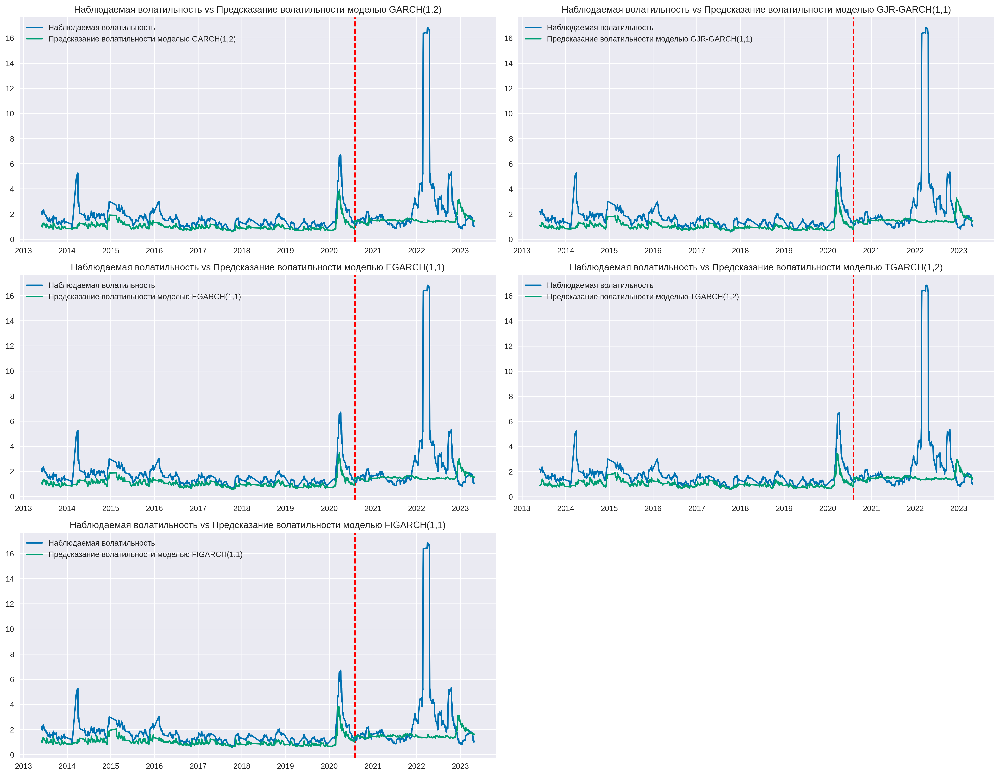

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(18,14))

axs[0, 0].axvline(x=imoex_daily.iloc[[train_size]].index, c='r', linestyle='--')
axs[0, 0].plot(imoex_daily['Volatility']*10, label = 'Наблюдаемая волатильность')
axs[0, 0].plot(imoex_daily['garch_vol'], label = 'Предсказание волатильности моделью GARCH(1,2)')
axs[0, 0].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью GARCH(1,2)")
axs[0, 0].legend()

axs[0, 1].axvline(x=imoex_daily.iloc[[train_size]].index, c='r', linestyle='--')
axs[0, 1].plot(imoex_daily['Volatility']*10, label = 'Наблюдаемая волатильность')
axs[0, 1].plot(imoex_daily['gjr_garch_vol'], label = 'Предсказание волатильности моделью GJR-GARCH(1,1)')
axs[0, 1].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью GJR-GARCH(1,1)")
axs[0, 1].legend()

axs[1, 0].axvline(x=imoex_daily.iloc[[train_size]].index, c='r', linestyle='--')
axs[1, 0].plot(imoex_daily['Volatility']*10, label = 'Наблюдаемая волатильность')
axs[1, 0].plot(imoex_daily['egarch_vol'], label = 'Предсказание волатильности моделью EGARCH(1,1)')
axs[1, 0].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью EGARCH(1,1)")
axs[1, 0].legend()

axs[1, 1].axvline(x=imoex_daily.iloc[[train_size]].index, c='r', linestyle='--')
axs[1, 1].plot(imoex_daily['Volatility']*10, label = 'Наблюдаемая волатильность')
axs[1, 1].plot(imoex_daily['tgarch_vol'], label = 'Предсказание волатильности моделью TGARCH(1,2)')
axs[1, 1].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью TGARCH(1,2)")
axs[1, 1].legend()

axs[2, 0].axvline(x=imoex_daily.iloc[[train_size]].index, c='r', linestyle='--')
axs[2, 0].plot(imoex_daily['Volatility']*10, label = 'Наблюдаемая волатильность')
axs[2, 0].plot(imoex_daily['figarch_vol'], label = 'Предсказание волатильности моделью FIGARCH(1,1)')
axs[2, 0].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью FIGARCH(1,1)")
axs[2, 0].legend()

axs[2, 1].set_visible(False)


plt.tight_layout()
plt.savefig('all_garch.png')
plt.show()

In [ ]:
training_set = imoex_daily.iloc[:, 8:19].values
train_size = int(len(training_set) * 0.7)
test_size = len(training_set) - train_size

In [ ]:
def sliding_windows(data, var_list, seq_length):
    x = []
    y = []

    for i in range(len(data['Volatility'])-2*seq_length):

        _x = np.array(data[var_list][i:(i+seq_length)])
        _y = data['Volatility'][i+2*seq_length]

        x.append(_x)
        y.append(_y)

    return np.array(x),np.array(y)

In [ ]:
def data_prepare(data,var_list, seq_length,train_size):
    x, y = sliding_windows(data, var_list, seq_length)

    x = x.astype(np.float64)
    y = y.astype(np.float64)
    y = np.array([y]).T
    dataX = Variable(torch.Tensor(x))
    dataY = Variable(torch.Tensor(y))

    trainX = Variable(torch.Tensor(x[:train_size]))
    trainY = Variable(torch.Tensor(y[:train_size]))

    testX = Variable(torch.Tensor(x[train_size:]))
    testY = Variable(torch.Tensor(y[train_size:]))

    return dataX,dataY,trainX,trainY,testX,testY

In [ ]:
class Net(torch.nn.Module):
    def __init__(self, input_size, hidden_size):
        super(Net, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.l1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.l2 = nn.Linear(hidden_size, 1)

    def forward(self, x):
        x = self.relu(self.l1(x))
        out = self.l2(x)

        return out

In [ ]:
class ResBlock(nn.Module):
    def __init__(
        self,
        hidden_size: int,
        use_dropout: bool = False,
        dropout_prob: float = 0.05,
        use_batchnorm: bool = False
    ) -> None:
        """
        Does the following transformation:
        x -> x + F(x), where
        F(x) = Linear -> ReLU -> Dropout -> BatchNorm -> Linear

        :param hidden_size:
        :param use_dropout:
        :param dropout_prob:
        :param use_batchnorm:
        """
        super().__init__()

        self.use_dropout = use_dropout
        self.use_batchnorm = use_batchnorm

        self.layers = []
        self.layers.append(nn.Linear(hidden_size, hidden_size))
        self.layers.append(nn.ReLU())

        if use_dropout:
            self.layers.append(nn.Dropout(dropout_prob))
        if use_batchnorm:
            self.layers.append(nn.BatchNorm1d(hidden_size))
        self.layers.append(nn.Linear(hidden_size, hidden_size))

        self.layers = nn.Sequential(*self.layers)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = inputs
        residual = self.layers(inputs)
        return x + residual


class ResNet(nn.Module):
    def __init__(
        self,
        input_size: int,
        hidden_size: int,
        output_size: int = 1,
        num_blocks: int = 1
    ) -> None:
        """
        Contains num_blocks of ResBlocks

        :param input_size:
        :param hidden_size:
        :param output_size:
        :param num_blocks:
        """

        super().__init__()

        self.linear_start = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()

        self.blocks = nn.ModuleList()
        self.num_blocks = num_blocks

        for _ in range(num_blocks):
            self.blocks.append(ResBlock(hidden_size, use_batchnorm = True, use_dropout = True))

        self.linear_end = nn.Linear(hidden_size, output_size)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = self.relu(self.linear_start(inputs))

        for block_index in range(self.num_blocks):
            x = self.blocks[block_index](x)

        x = self.linear_end(x)

        return x

In [ ]:
class LSTM(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, head_type = 'FC'):
        super(LSTM, self).__init__()

        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_length = seq_length
        self.head_type = head_type

        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True)

        if head_type == 'FC':
          self.head = nn.Linear(hidden_size, num_classes)
        elif head_type == 'ResNet':
          self.head = ResNet(input_size = hidden_size, hidden_size = 2, num_blocks = 2)
        elif head_type == 'MLP':
          self.head = Net(input_size = hidden_size, hidden_size = 2)


    def forward(self, x):

        h_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))

        c_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))

        ula, (h_out, _) = self.lstm(x, (h_0, c_0))

        h_out = h_out.view(-1, self.hidden_size)

        if self.head_type == 'FC':
          out = self.head(h_out)
        else:
          out = self.head.forward(h_out)

        return out

Модель состоит из разных типов GARCH моделей, результаты которых подаются в LSTM и далее предсказывается волатильность с помощью FC слоя

Epoch: 0, loss: 0.38045
Epoch: 20, loss: 0.04634
Epoch: 40, loss: 0.03954
Epoch: 60, loss: 0.03700
Epoch: 80, loss: 0.03655
Epoch: 100, loss: 0.03627
Epoch: 120, loss: 0.03607
Epoch: 140, loss: 0.03592
Epoch: 160, loss: 0.03577
Epoch: 180, loss: 0.03560
Epoch: 200, loss: 0.03546
Epoch: 220, loss: 0.03528
Epoch: 240, loss: 0.03503
Epoch: 260, loss: 0.03484
Epoch: 280, loss: 0.03489
Epoch: 300, loss: 0.03478
Epoch: 320, loss: 0.03393
Epoch: 340, loss: 0.03436
Epoch: 360, loss: 0.03378
Epoch: 380, loss: 0.03326
Epoch: 400, loss: 0.03366
Epoch: 420, loss: 0.03266
Epoch: 440, loss: 0.03246
Epoch: 460, loss: 0.03206
Epoch: 480, loss: 0.03255


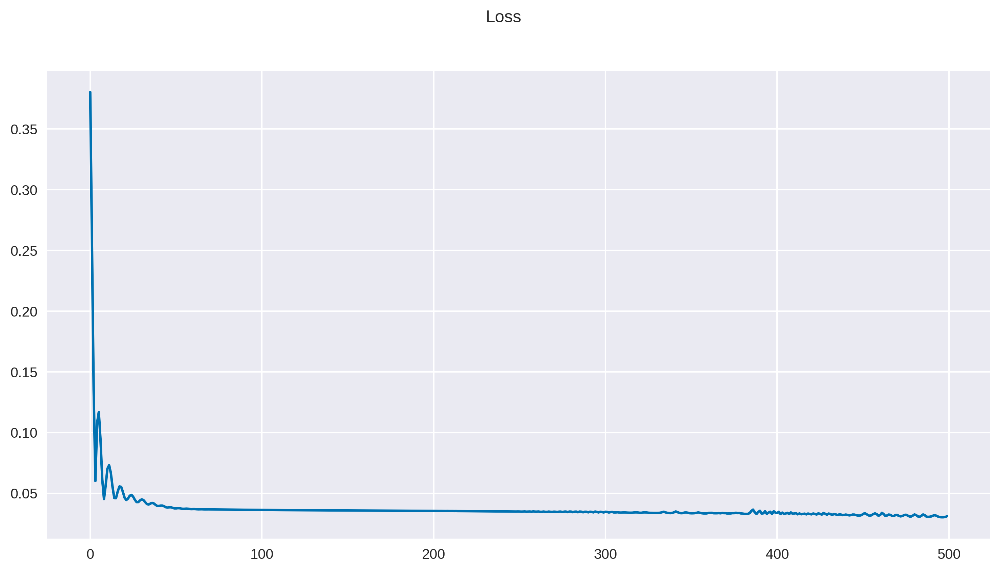

In [ ]:
var_list = ['Volatility', 'garch_vol','garch_resid', 'gjr_garch_vol', 'gjr_garch_resid', 'egarch_vol','egarch_resid', 'tgarch_vol','tgarch_resid', 'figarch_vol','figarch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm_1 = LSTM(num_classes, input_size, hidden_size, num_layers, head_type = 'FC')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm_1.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm_1.train()
for epoch in range(num_epochs):
    outputs = lstm_1(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

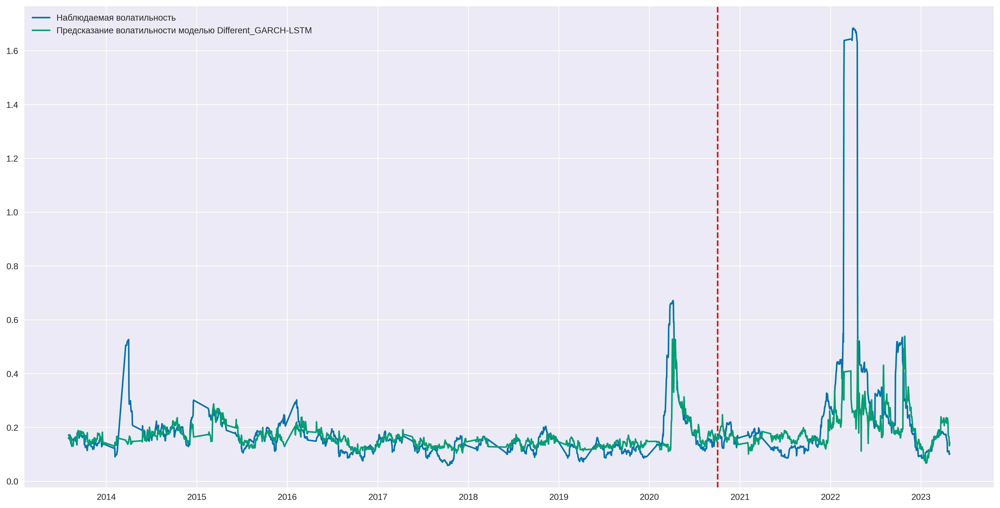

In [ ]:
lstm_1.eval()
train_predict = lstm_1(dataX)

data_predict_all_garch_fc = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_fc, label = 'Предсказание волатильности моделью Different_GARCH-LSTM')
plt.legend()
plt.savefig('all_garch_fc.png')
plt.show()

In [ ]:
def Error_stat(dataY_plot,data_predict,train_size):
    MAE_test = (abs(dataY_plot[train_size:] - data_predict[train_size:])).mean()
    MSE_test = ((dataY_plot[train_size:] - data_predict[train_size:])**2).mean()
    RMSE_test = np.sqrt(((dataY_plot[train_size:] - data_predict[train_size:])**2).mean())
    HMAE_test = (abs(1-dataY_plot[train_size:]/data_predict[train_size:])).mean()
    HMSE_test = ((1-dataY_plot[train_size:]/data_predict[train_size:])**2).mean()
    MAE_train = (abs(dataY_plot[:train_size] - data_predict[:train_size])).mean()
    MSE_train = ((dataY_plot[:train_size] - data_predict[:train_size])**2).mean()
    RMSE_train = np.sqrt(((dataY_plot[:train_size] - data_predict[:train_size])**2).mean())
    HMAE_train = (abs(1-dataY_plot[:train_size]/data_predict[:train_size])).mean()
    HMSE_train = ((1-dataY_plot[:train_size]/data_predict[:train_size])**2).mean()
    MAE_overall = (abs(dataY_plot - data_predict)).mean()
    MSE_overall = ((dataY_plot - data_predict)**2).mean()
    RMSE_overall = np.sqrt(((dataY_plot - data_predict)**2).mean())
    HMAE_overall = (abs(1-dataY_plot/data_predict)).mean()
    HMSE_overall = ((1-dataY_plot/data_predict)**2).mean()
    final_stat = pd.DataFrame([['','Test','Train','Overall'],
                               ['MAE',MAE_test,MAE_train,MAE_overall],
                               ['MSE',MSE_test,MSE_train,MSE_overall],
                               ['RMSE',RMSE_test,RMSE_train,RMSE_overall],
                               ['HMAE',HMAE_test,HMAE_train,HMAE_overall],
                               ['HMSE',HMSE_test,HMSE_train,HMSE_overall]])
    return final_stat

In [ ]:
table_1 = Error_stat(dataY_plot,data_predict_all_garch_fc,train_size)
table_1

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.115158,0.032222,0.055884
2,MSE,0.077748,0.004182,0.02517
3,RMSE,0.278833,0.064667,0.158651
4,HMAE,0.534338,0.212989,0.304669
5,HMSE,1.290568,0.21246,0.520043


Модель состоит из разных типов GARCH моделей, результаты которых подаются в LSTM, потом обычная нейронная сеть и далее предсказывается волатильность

Epoch: 0, loss: 0.54192
Epoch: 20, loss: 0.11401
Epoch: 40, loss: 0.05217
Epoch: 60, loss: 0.04632
Epoch: 80, loss: 0.04424
Epoch: 100, loss: 0.04053
Epoch: 120, loss: 0.03838
Epoch: 140, loss: 0.03738
Epoch: 160, loss: 0.03692
Epoch: 180, loss: 0.03641
Epoch: 200, loss: 0.03574
Epoch: 220, loss: 0.03511
Epoch: 240, loss: 0.03463
Epoch: 260, loss: 0.03415
Epoch: 280, loss: 0.03371
Epoch: 300, loss: 0.03331
Epoch: 320, loss: 0.03291
Epoch: 340, loss: 0.03248
Epoch: 360, loss: 0.03196
Epoch: 380, loss: 0.03152
Epoch: 400, loss: 0.03108
Epoch: 420, loss: 0.03063
Epoch: 440, loss: 0.03011


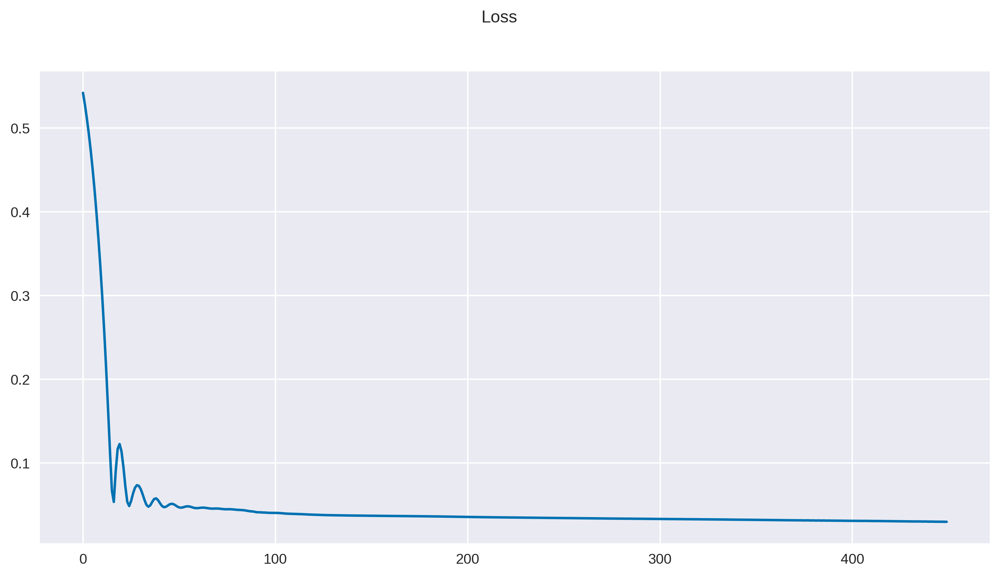

In [ ]:
var_list = ['Volatility', 'garch_vol','garch_resid', 'gjr_garch_vol', 'gjr_garch_resid', 'egarch_vol','egarch_resid', 'tgarch_vol','tgarch_resid', 'figarch_vol','figarch_resid']

seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 450
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm_2 = LSTM(num_classes, input_size, hidden_size, num_layers, head_type = 'MLP')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm_2.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm_2.train()
for epoch in range(num_epochs):
    outputs = lstm_2(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

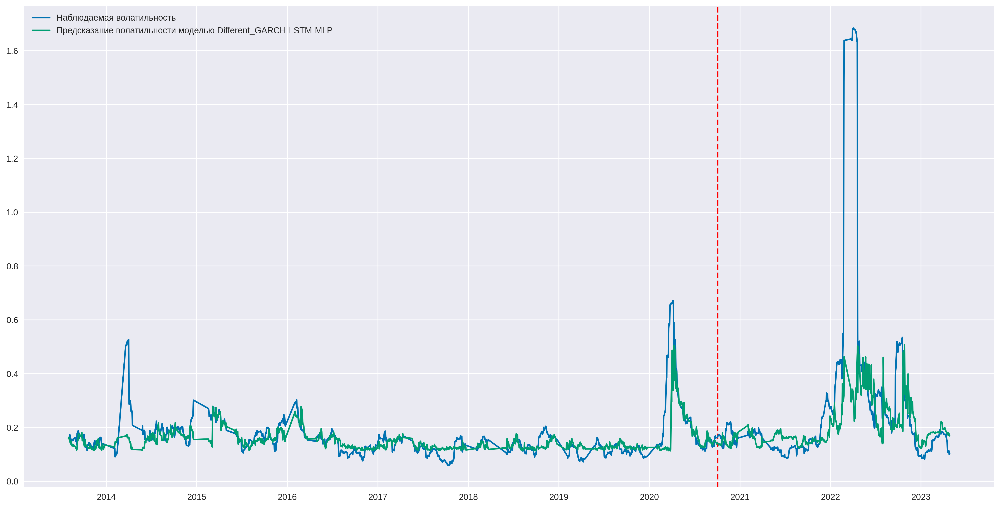

In [ ]:
lstm_2.eval()
train_predict = lstm_2(dataX)

data_predict_all_garch_mlp = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_mlp, label = 'Предсказание волатильности моделью Different_GARCH-LSTM-MLP')
plt.legend()
plt.savefig('all_garch_mlp.png')
plt.show()

In [ ]:
table_2 = Error_stat(dataY_plot,data_predict_all_garch_mlp,train_size)
table_2

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.111837,0.029888,0.053268
2,MSE,0.072188,0.003952,0.02342
3,RMSE,0.268679,0.062865,0.153035
4,HMAE,0.485517,0.207871,0.287083
5,HMSE,0.928733,0.209191,0.414475


In [ ]:
torch.save(lstm_2.state_dict(), 'checkpoint_mlp.pth')

Epoch: 0, loss: 0.87618
Epoch: 20, loss: 0.05182
Epoch: 40, loss: 0.04294
Epoch: 60, loss: 0.03897
Epoch: 80, loss: 0.03846
Epoch: 100, loss: 0.03822
Epoch: 120, loss: 0.03810
Epoch: 140, loss: 0.03802
Epoch: 160, loss: 0.03795
Epoch: 180, loss: 0.03789
Epoch: 200, loss: 0.03784
Epoch: 220, loss: 0.03780
Epoch: 240, loss: 0.03777
Epoch: 260, loss: 0.03773
Epoch: 280, loss: 0.03770
Epoch: 300, loss: 0.03767
Epoch: 320, loss: 0.03764
Epoch: 340, loss: 0.03761
Epoch: 360, loss: 0.03758
Epoch: 380, loss: 0.03755
Epoch: 400, loss: 0.03752
Epoch: 420, loss: 0.03749
Epoch: 440, loss: 0.03746


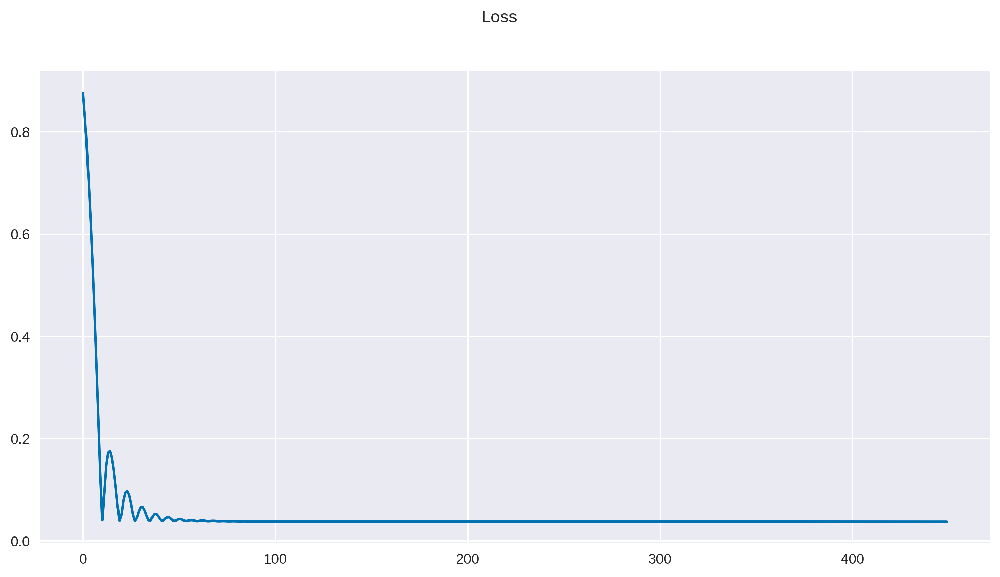

In [ ]:
var_list = ['Volatility', 'garch_vol', 'gjr_garch_vol', 'egarch_vol', 'tgarch_vol', 'figarch_vol']

seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 450
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm_2 = LSTM(num_classes, input_size, hidden_size, num_layers, head_type = 'MLP')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm_2.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm_2.train()
for epoch in range(num_epochs):
    outputs = lstm_2(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

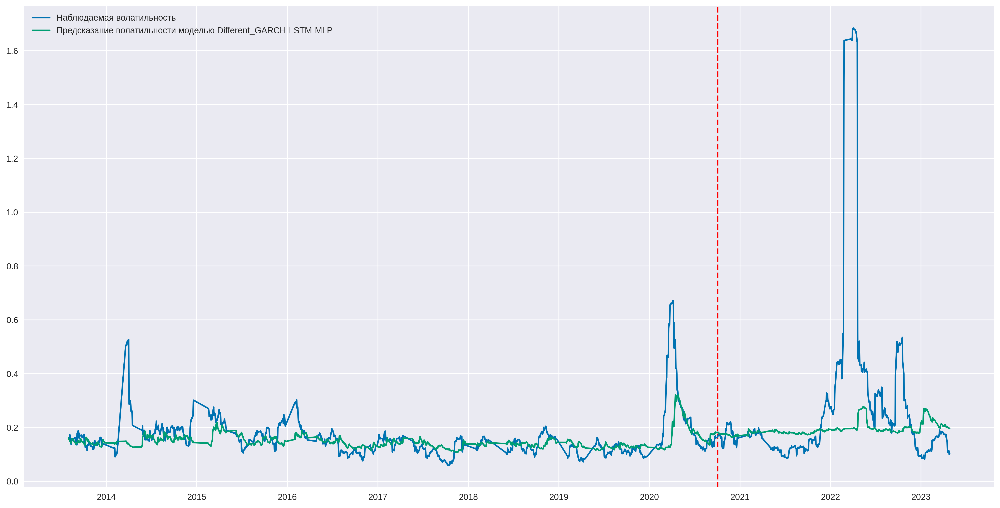

In [ ]:
lstm_2.eval()
train_predict = lstm_2(dataX)

data_predict_all_garch_mlp = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_mlp, label = 'Предсказание волатильности моделью Different_GARCH-LSTM-MLP')
plt.legend()
plt.savefig('all_garch_mlp.png')
plt.show()

In [ ]:
# Use the training data for deep explainer => can use fewer instances
explainer = shap.DeepExplainer(lstm_2, trainX)
# explain the the testing instances (can use fewer instanaces)
# explaining each prediction requires 2 * background dataset size runs
shap_values = explainer.shap_values(testX)
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list)

In [ ]:
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list,show=False,matplotlib=True).savefig("shap_2.png")

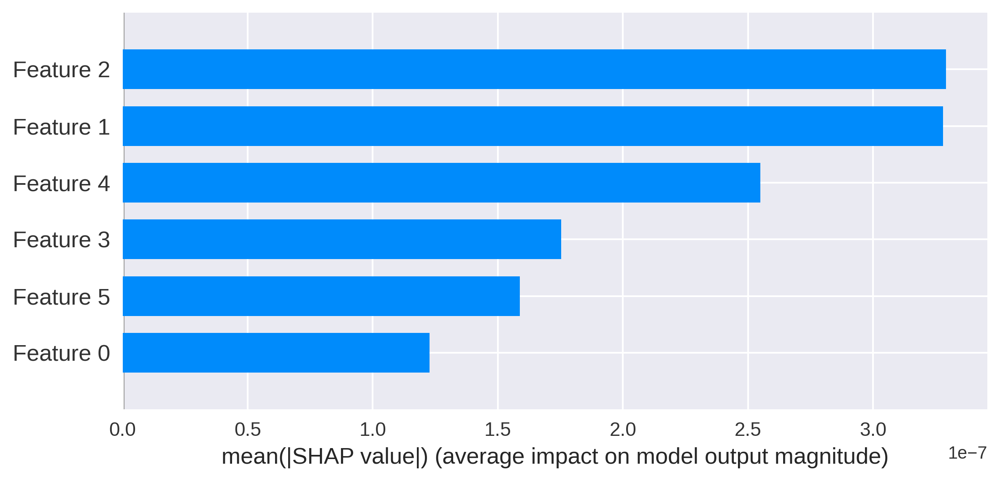

In [ ]:
shap.summary_plot(shap_values[:, 0, :], testX[:10][:, 0, :], plot_type="bar")

Модель состоит из разных типов GARCH моделей, результаты которых подаются в LSTM, потом ResNet и далее предсказывается волатильность

In [ ]:
class ResBlock(nn.Module):
    def __init__(
        self,
        hidden_size: int,
        use_dropout: bool = False,
        dropout_prob: float = 0.05,
        use_batchnorm: bool = False
    ) -> None:
        """
        Does the following transformation:
        x -> x + F(x), where
        F(x) = Linear -> ReLU -> Dropout -> BatchNorm -> Linear

        :param hidden_size:
        :param use_dropout:
        :param dropout_prob:
        :param use_batchnorm:
        """
        super().__init__()

        self.use_dropout = use_dropout
        self.use_batchnorm = use_batchnorm

        self.layers = []
        self.layers.append(nn.Linear(hidden_size, hidden_size))
        self.layers.append(nn.ReLU())

        if use_dropout:
            self.layers.append(nn.Dropout(dropout_prob))
        if use_batchnorm:
            self.layers.append(nn.BatchNorm1d(hidden_size))
        self.layers.append(nn.Linear(hidden_size, hidden_size))

        self.layers = nn.Sequential(*self.layers)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = inputs
        residual = self.layers(inputs)
        return x + residual


class ResNet(nn.Module):
    def __init__(
        self,
        input_size: int,
        hidden_size: int,
        output_size: int = 1,
        num_blocks: int = 1
    ) -> None:
        """
        Contains num_blocks of ResBlocks

        :param input_size:
        :param hidden_size:
        :param output_size:
        :param num_blocks:
        """

        super().__init__()

        self.linear_start = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()

        self.blocks = nn.ModuleList()
        self.num_blocks = num_blocks

        for _ in range(num_blocks):
            self.blocks.append(ResBlock(hidden_size, use_batchnorm = True, use_dropout = True))

        self.linear_end = nn.Linear(hidden_size, output_size)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = self.relu(self.linear_start(inputs))

        for block_index in range(self.num_blocks):
            x = self.blocks[block_index](x)

        x = self.linear_end(x)

        return x

In [ ]:
class LSTM(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, head_type = 'FC'):
        super(LSTM, self).__init__()

        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_length = seq_length
        self.head_type = head_type

        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True)

        if head_type == 'FC':
          self.head = nn.Linear(hidden_size, num_classes)
        elif head_type == 'ResNet':
          self.head = ResNet(input_size = hidden_size, hidden_size = 2, num_blocks = 2)
        elif head_type == 'MLP':
          self.head = Net(hidden_size, 1)


    def forward(self, x):

        h_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))

        c_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))

        # Propagate input through LSTM
        ula, (h_out, _) = self.lstm(x, (h_0, c_0))

        h_out = h_out.view(-1, self.hidden_size)

        if self.head_type == 'FC':
          out = self.head(h_out)
        else:
          out = self.head.forward(h_out)

        return out

Epoch: 0, loss: 0.42889
Epoch: 20, loss: 0.08833
Epoch: 40, loss: 0.05423
Epoch: 60, loss: 0.04324
Epoch: 80, loss: 0.03853
Epoch: 100, loss: 0.03785
Epoch: 120, loss: 0.03764
Epoch: 140, loss: 0.03755
Epoch: 160, loss: 0.03754
Epoch: 180, loss: 0.03750
Epoch: 200, loss: 0.03746
Epoch: 220, loss: 0.03743
Epoch: 240, loss: 0.03741
Epoch: 260, loss: 0.03733
Epoch: 280, loss: 0.03735
Epoch: 300, loss: 0.03721
Epoch: 320, loss: 0.03715
Epoch: 340, loss: 0.03708
Epoch: 360, loss: 0.03719
Epoch: 380, loss: 0.03683
Epoch: 400, loss: 0.03789
Epoch: 420, loss: 0.03655
Epoch: 440, loss: 0.03602
Epoch: 460, loss: 0.03533
Epoch: 480, loss: 0.03493


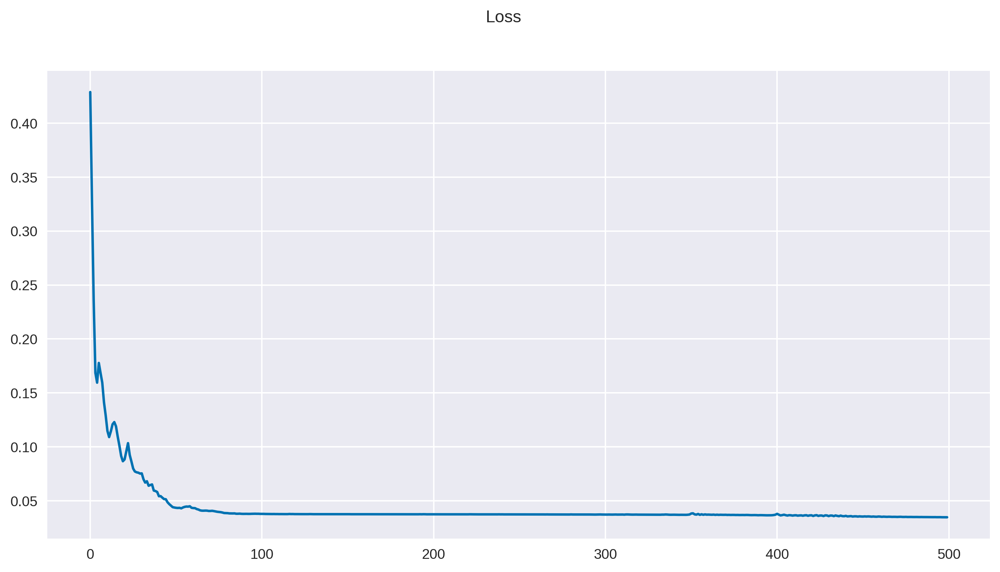

In [ ]:
var_list = ['Volatility', 'garch_vol', 'gjr_garch_vol', 'egarch_vol', 'tgarch_vol', 'figarch_vol']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm_3 = LSTM(num_classes, input_size, hidden_size, num_layers, head_type = 'ResNet')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm_3.parameters(), lr=learning_rate)

loss_list = []

lstm_3.train()
for epoch in range(num_epochs):
    outputs = lstm_3(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

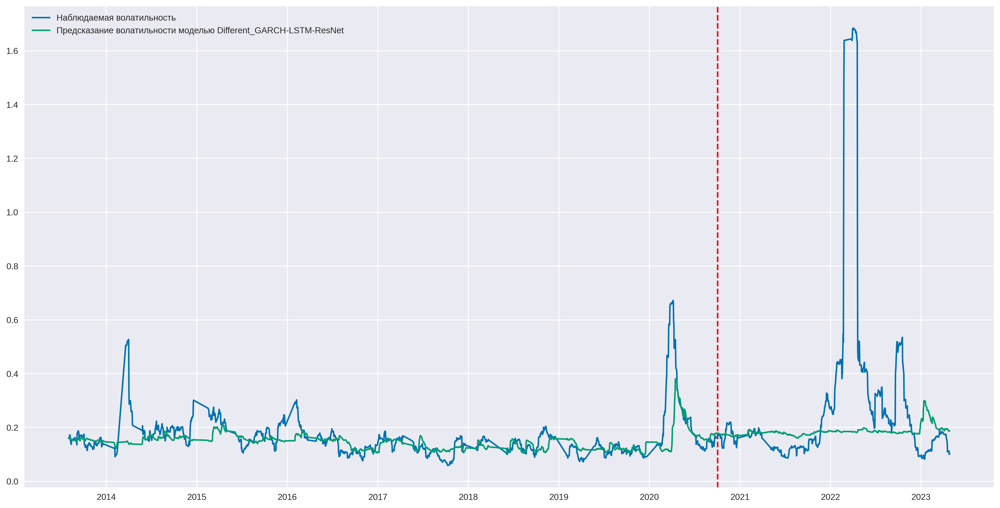

In [ ]:
lstm_3.eval()
train_predict = lstm_3(dataX)

data_predict_all_garch_resnet = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_resnet, label = 'Предсказание волатильности моделью Different_GARCH-LSTM-ResNet')
plt.legend()
plt.savefig('all_garch_resnet_3.png')
plt.show()

In [ ]:
# Use the training data for deep explainer => can use fewer instances
explainer = shap.DeepExplainer(lstm_3, trainX)
# explain the the testing instances (can use fewer instanaces)
# explaining each prediction requires 2 * background dataset size runs
shap_values = explainer.shap_values(testX)
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list)

In [ ]:
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list,show=False,matplotlib=True).savefig("shap_1.png")

In [ ]:
table_ = Error_stat(dataY_plot,data_predict_all_garch_resnet,train_size)
table_

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.122787,0.03662,0.061203
2,MSE,0.076978,0.004463,0.025152
3,RMSE,0.277449,0.066807,0.158592
4,HMAE,0.555148,0.225339,0.319433
5,HMSE,1.062744,0.176076,0.429041


Epoch: 0, loss: 0.60990
Epoch: 20, loss: 0.04914
Epoch: 40, loss: 0.04358
Epoch: 60, loss: 0.04201
Epoch: 80, loss: 0.03961
Epoch: 100, loss: 0.03839
Epoch: 120, loss: 0.03677
Epoch: 140, loss: 0.03646
Epoch: 160, loss: 0.03656
Epoch: 180, loss: 0.03611
Epoch: 200, loss: 0.03601
Epoch: 220, loss: 0.03616
Epoch: 240, loss: 0.03570
Epoch: 260, loss: 0.03580
Epoch: 280, loss: 0.03522
Epoch: 300, loss: 0.03514
Epoch: 320, loss: 0.03464
Epoch: 340, loss: 0.03416
Epoch: 360, loss: 0.03420
Epoch: 380, loss: 0.03393
Epoch: 400, loss: 0.03298
Epoch: 420, loss: 0.03250
Epoch: 440, loss: 0.03211
Epoch: 460, loss: 0.03333
Epoch: 480, loss: 0.03209


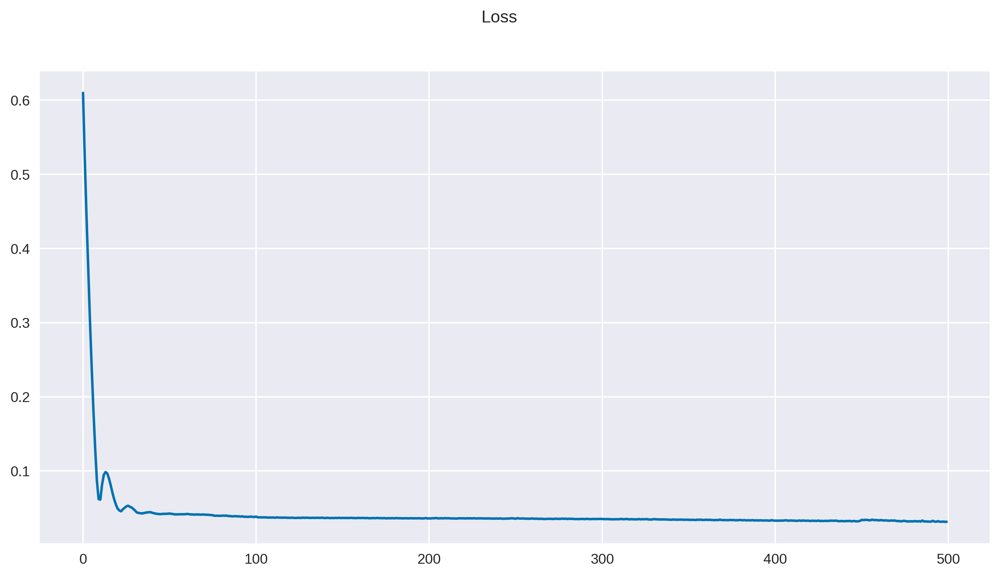

In [ ]:
var_list = ['Volatility', 'garch_vol','garch_resid', 'gjr_garch_resid', 'gjr_garch_vol', 'egarch_vol','egarch_resid', 'tgarch_vol','tgarch_resid', 'figarch_vol','figarch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm_3 = LSTM(num_classes, input_size, hidden_size, num_layers, head_type = 'ResNet')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm_3.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm_3.train()
for epoch in range(num_epochs):
    outputs = lstm_3(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

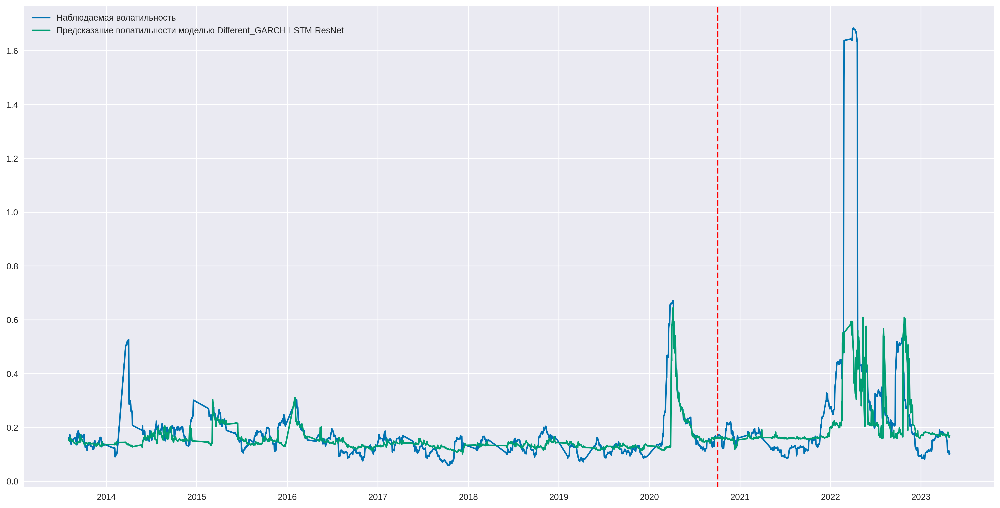

In [ ]:
lstm_3.eval()
train_predict = lstm_3(dataX)

data_predict_all_garch_resnet = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_resnet, label = 'Предсказание волатильности моделью Different_GARCH-LSTM-ResNet')
plt.legend()
plt.savefig('all_garch_resnet_3.png')
plt.show()

In [ ]:
table_5 = Error_stat(dataY_plot,data_predict_all_garch_resnet,train_size)
table_5

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.111475,0.031336,0.0542
2,MSE,0.062174,0.003788,0.020445
3,RMSE,0.249347,0.061546,0.142987
4,HMAE,0.441498,0.2241,0.286123
5,HMSE,0.571737,0.210934,0.31387


In [ ]:
torch.save(lstm_3.state_dict(), 'checkpoint_resnet.pth')

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 9.3 MB/s eta 0:00:00


In [ ]:
var_list = ['Volatility', 'garch_vol','garch_resid', 'egarch_vol','egarch_resid', 'tgarch_vol','tgarch_resid', 'figarch_vol','figarch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm_resnet = LSTM(num_classes, input_size, hidden_size, num_layers, head_type = 'ResNet')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm_resnet.parameters(), lr=learning_rate)

loss_list = []

In [ ]:
lstm_resnet.load_state_dict(torch.load('checkpoint_2.pth'))
lstm_resnet.eval()

LSTM(
  (lstm): LSTM(9, 9, batch_first=True)
  (head): ResNet(
    (linear_start): Linear(in_features=9, out_features=2, bias=True)
    (relu): ReLU()
    (blocks): ModuleList(
      (0-1): 2 x ResBlock(
        (layers): Sequential(
          (0): Linear(in_features=2, out_features=2, bias=True)
          (1): ReLU()
          (2): Dropout(p=0.05, inplace=False)
          (3): BatchNorm1d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (4): Linear(in_features=2, out_features=2, bias=True)
        )
      )
    )
    (linear_end): Linear(in_features=2, out_features=1, bias=True)
  )
)

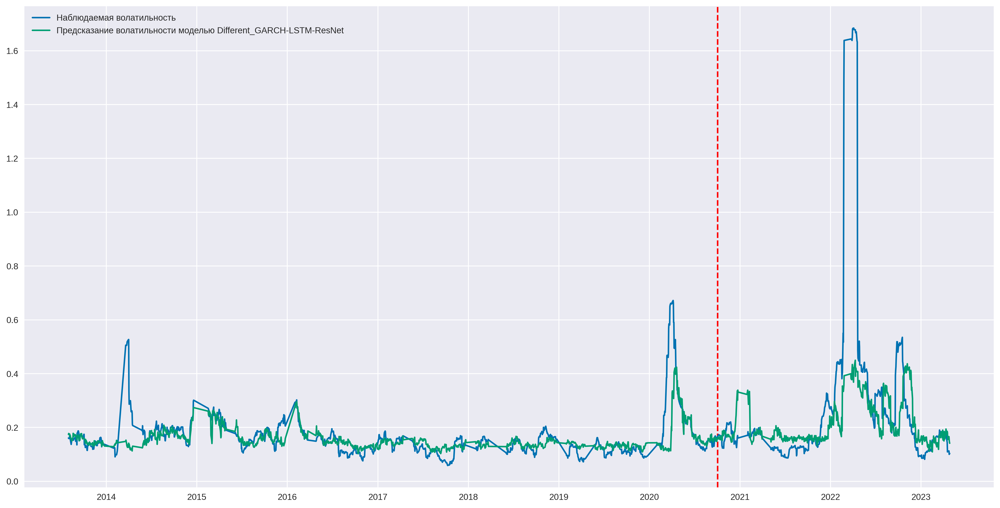

In [ ]:
train_predict = lstm_resnet(dataX)

data_predict_all_garch_resnet = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_resnet, label = 'Предсказание волатильности моделью Different_GARCH-LSTM-ResNet')
plt.legend()
plt.savefig('all_garch_resnet_3.png')
plt.show()

In [ ]:
import shap

# we use the first 100 training examples as our background dataset to integrate over
explainer = shap.DeepExplainer(lstm_3, data=trainX[:100])

# explain the first 10 predictions
# explaining each prediction requires 2 * background dataset size runs
shap_values = explainer.shap_values(testX[:10])

In [ ]:
# Use the training data for deep explainer => can use fewer instances
explainer = shap.DeepExplainer(lstm_3, trainX)
# explain the the testing instances (can use fewer instanaces)
# explaining each prediction requires 2 * background dataset size runs
shap_values = explainer.shap_values(testX)
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list)

In [ ]:
# Use the training data for deep explainer => can use fewer instances
explainer = shap.DeepExplainer(lstm_2, trainX)
# explain the the testing instances (can use fewer instanaces)
# explaining each prediction requires 2 * background dataset size runs
shap_values = explainer.shap_values(testX)
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list)

In [ ]:
explainer.expected_value[0]

0.15269482

In [ ]:
shap_values[:, 0, :][0][0]

-6.000406210660003e-05

In [ ]:
x_test_words[0]

array(['NONE', 'NONE', 'NONE', 'NONE', 'NONE', 'NONE', 'NONE', 'NONE',
       'NONE', 'NONE', 'NONE', 'NONE', 'NONE', 'NONE', 'NONE', 'NONE',
       'NONE', 'NONE', 'NONE', 'NONE', 'NONE', 'NONE'], dtype='<U4')

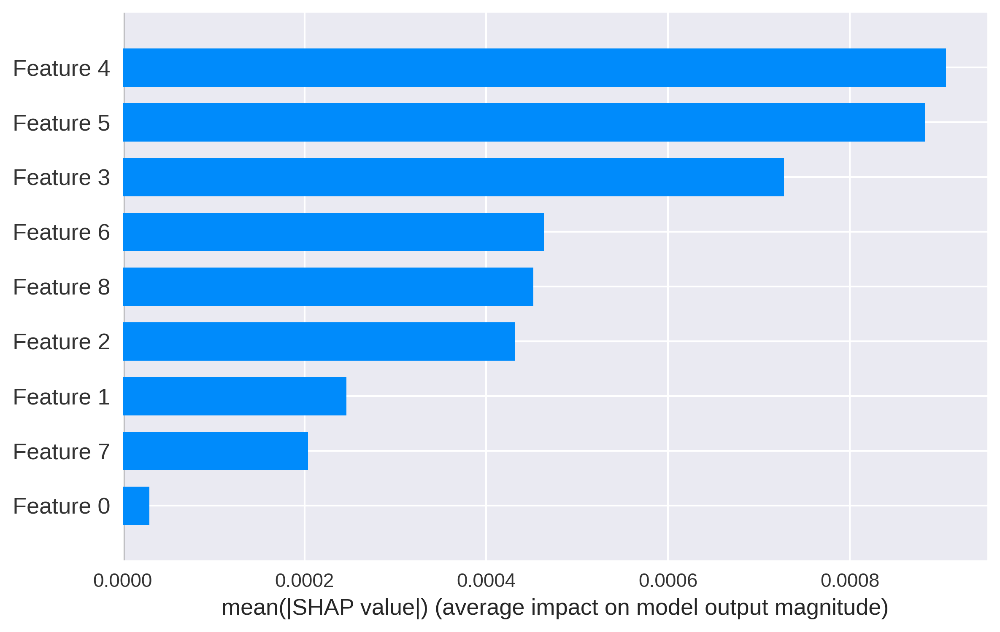

In [ ]:
shap.summary_plot(shap_values[:, 0, :], testX[:10][:, 0, :], plot_type="bar")

Далее построим несколько моделей GARCH-LSTM и посмотрим на волатильность

Epoch: 0, loss: 0.27548
Epoch: 20, loss: 0.05294
Epoch: 40, loss: 0.04370
Epoch: 60, loss: 0.03922
Epoch: 80, loss: 0.03798
Epoch: 100, loss: 0.03746
Epoch: 120, loss: 0.03698
Epoch: 140, loss: 0.03654
Epoch: 160, loss: 0.03635
Epoch: 180, loss: 0.03613
Epoch: 200, loss: 0.03594
Epoch: 220, loss: 0.03585
Epoch: 240, loss: 0.03577
Epoch: 260, loss: 0.03572
Epoch: 280, loss: 0.03568
Epoch: 300, loss: 0.03570
Epoch: 320, loss: 0.03566
Epoch: 340, loss: 0.03555
Epoch: 360, loss: 0.03551
Epoch: 380, loss: 0.03547
Epoch: 400, loss: 0.03543
Epoch: 420, loss: 0.03547
Epoch: 440, loss: 0.03540
Epoch: 460, loss: 0.03535
Epoch: 480, loss: 0.03531


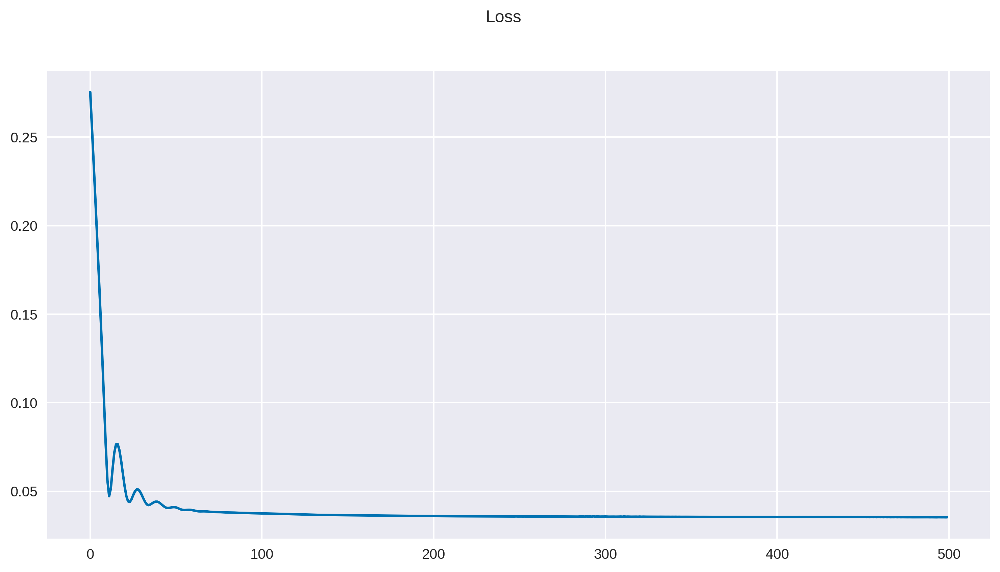

In [ ]:
var_list = ['Volatility', 'garch_vol','garch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm = LSTM(num_classes, input_size, hidden_size, num_layers)
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm.train()
for epoch in range(num_epochs):
    outputs = lstm(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

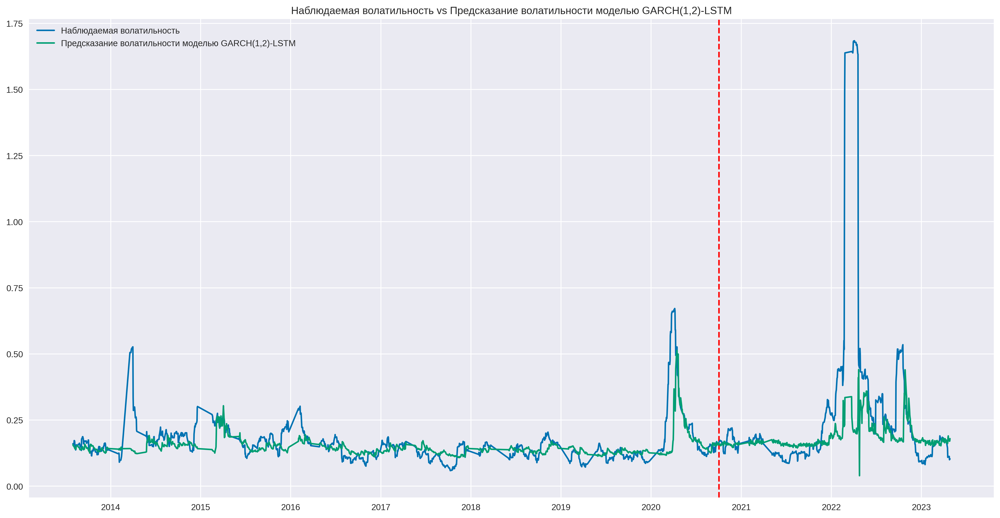

In [ ]:
lstm.eval()
train_predict = lstm(dataX)

data_predict_garch = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_garch, label = 'Предсказание волатильности моделью GARCH(1,2)-LSTM')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью GARCH(1,2)-LSTM')
plt.legend()
plt.show()

In [ ]:
table_6 = Error_stat(dataY_plot,data_predict_garch,train_size)
table_6

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.114508,0.035295,0.057894
2,MSE,0.082899,0.004776,0.027064
3,RMSE,0.287921,0.069107,0.164512
4,HMAE,0.589379,0.247246,0.344856
5,HMSE,1.99376,0.235266,0.736961


In [ ]:
imoex = pd.DataFrame(data = dataY_plot,
                  columns = ['Volatility'])

In [ ]:
imoex['lstm_garch_vol'] = data_predict_garch
imoex

,Volatility,lstm_garch_vol
0,0.160701,0.156849
1,0.159258,0.153457
2,0.158622,0.150451
3,0.172347,0.149431
4,0.172116,0.146103
...,...,...
2056,0.110916,0.174726
2057,0.112594,0.171070
2058,0.100063,0.170108
2059,0.101756,0.170620


Epoch: 0, loss: 0.26867
Epoch: 20, loss: 0.05906
Epoch: 40, loss: 0.04035
Epoch: 60, loss: 0.03862
Epoch: 80, loss: 0.03776
Epoch: 100, loss: 0.03729
Epoch: 120, loss: 0.03686
Epoch: 140, loss: 0.03656
Epoch: 160, loss: 0.03643
Epoch: 180, loss: 0.03634
Epoch: 200, loss: 0.03626
Epoch: 220, loss: 0.03620
Epoch: 240, loss: 0.03612
Epoch: 260, loss: 0.03604
Epoch: 280, loss: 0.03593
Epoch: 300, loss: 0.03582
Epoch: 320, loss: 0.03567
Epoch: 340, loss: 0.03549
Epoch: 360, loss: 0.03539
Epoch: 380, loss: 0.03532
Epoch: 400, loss: 0.03527
Epoch: 420, loss: 0.03520
Epoch: 440, loss: 0.03517
Epoch: 460, loss: 0.03512
Epoch: 480, loss: 0.03504


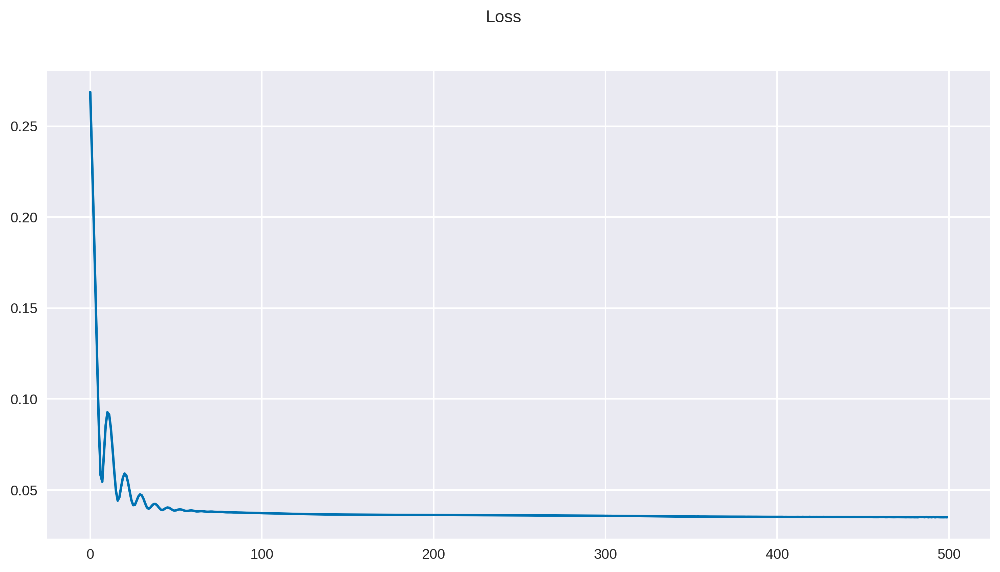

In [ ]:
var_list = ['Volatility', 'tgarch_vol','tgarch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm = LSTM(num_classes, input_size, hidden_size, num_layers)
criterion = torch.nn.L1Loss()    #mean-squared error
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm.train()
for epoch in range(num_epochs):
    outputs = lstm(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

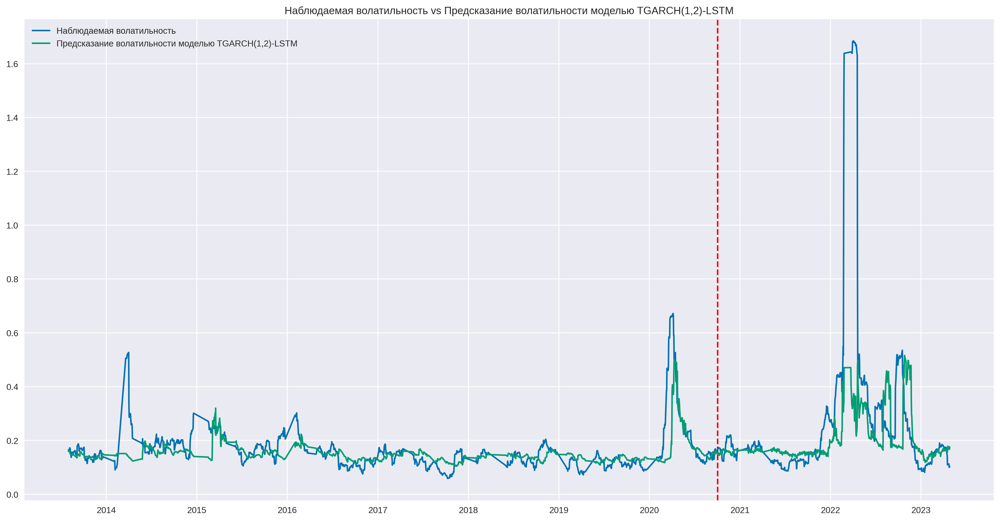

In [ ]:
lstm.eval()
train_predict = lstm(dataX)

data_predict_tgarch = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_tgarch, label = 'Предсказание волатильности моделью TGARCH(1,2)-LSTM')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью TGARCH(1,2)-LSTM')
plt.legend()
plt.show()

In [ ]:
table_7 = Error_stat(dataY_plot,data_predict_tgarch,train_size)
table_7

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.118508,0.035057,0.058866
2,MSE,0.074422,0.004521,0.024464
3,RMSE,0.272803,0.067239,0.156409
4,HMAE,0.500746,0.240381,0.314663
5,HMSE,0.959621,0.213871,0.426632


In [ ]:
imoex['lstm_tgarch_vol'] = data_predict_tgarch
imoex

,Volatility,lstm_garch_vol,lstm_tgarch_vol
0,0.160701,0.156849,0.166046
1,0.159258,0.153457,0.163623
2,0.158622,0.150451,0.160117
3,0.172347,0.149431,0.158536
4,0.172116,0.146103,0.154564
...,...,...,...
2056,0.110916,0.174726,0.170264
2057,0.112594,0.171070,0.168538
2058,0.100063,0.170108,0.167410
2059,0.101756,0.170620,0.166857


Epoch: 0, loss: 0.35412
Epoch: 20, loss: 0.05326
Epoch: 40, loss: 0.04560
Epoch: 60, loss: 0.04237
Epoch: 80, loss: 0.04022
Epoch: 100, loss: 0.03914
Epoch: 120, loss: 0.03854
Epoch: 140, loss: 0.03804
Epoch: 160, loss: 0.03758
Epoch: 180, loss: 0.03716
Epoch: 200, loss: 0.03686
Epoch: 220, loss: 0.03671
Epoch: 240, loss: 0.03657
Epoch: 260, loss: 0.03646
Epoch: 280, loss: 0.03635
Epoch: 300, loss: 0.03624
Epoch: 320, loss: 0.03615
Epoch: 340, loss: 0.03605
Epoch: 360, loss: 0.03588
Epoch: 380, loss: 0.03577
Epoch: 400, loss: 0.03569
Epoch: 420, loss: 0.03562
Epoch: 440, loss: 0.03555
Epoch: 460, loss: 0.03548
Epoch: 480, loss: 0.03541


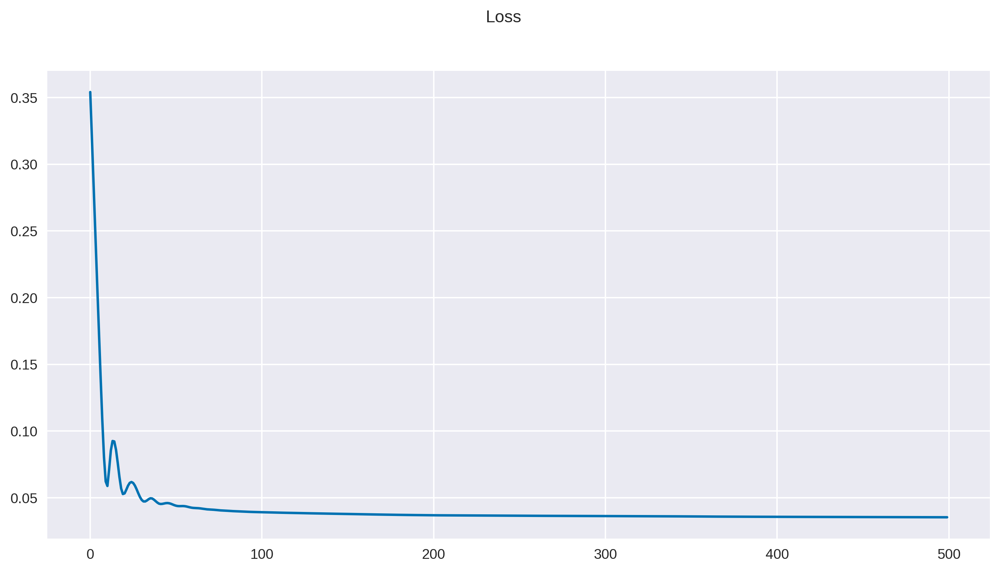

In [ ]:
var_list = ['Volatility', 'figarch_vol','figarch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm = LSTM(num_classes, input_size, hidden_size, num_layers)
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm.train()
for epoch in range(num_epochs):
    outputs = lstm(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

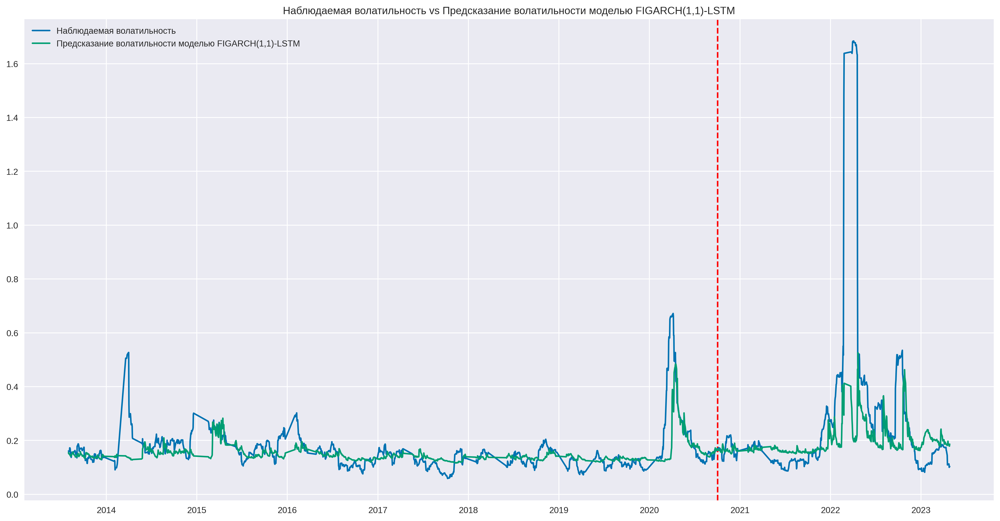

In [ ]:
lstm.eval()
train_predict = lstm(dataX)

data_predict_figarch = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_figarch, label = 'Предсказание волатильности моделью FIGARCH(1,1)-LSTM')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью FIGARCH(1,1)-LSTM')
plt.legend()
plt.show()

In [ ]:
table_8 = Error_stat(dataY_plot,data_predict_figarch,train_size)
table_8

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.117498,0.03535,0.058787
2,MSE,0.080648,0.004682,0.026355
3,RMSE,0.283985,0.068423,0.162341
4,HMAE,0.566046,0.243677,0.335648
5,HMSE,1.655513,0.227567,0.634958


In [ ]:
imoex['lstm_figarch_vol'] = data_predict_figarch
imoex

,Volatility,lstm_garch_vol,lstm_tgarch_vol,lstm_figarch_vol
0,0.160701,0.156849,0.166046,0.153542
1,0.159258,0.153457,0.163623,0.150064
2,0.158622,0.150451,0.160117,0.146989
3,0.172347,0.149431,0.158536,0.147225
4,0.172116,0.146103,0.154564,0.142352
...,...,...,...,...
2056,0.110916,0.174726,0.170264,0.187477
2057,0.112594,0.171070,0.168538,0.185044
2058,0.100063,0.170108,0.167410,0.184243
2059,0.101756,0.170620,0.166857,0.183688


Epoch: 0, loss: 0.11229
Epoch: 20, loss: 0.04542
Epoch: 40, loss: 0.04247
Epoch: 60, loss: 0.03982
Epoch: 80, loss: 0.03743
Epoch: 100, loss: 0.03683
Epoch: 120, loss: 0.03670
Epoch: 140, loss: 0.03657
Epoch: 160, loss: 0.03645
Epoch: 180, loss: 0.03634
Epoch: 200, loss: 0.03624
Epoch: 220, loss: 0.03613
Epoch: 240, loss: 0.03603
Epoch: 260, loss: 0.03592
Epoch: 280, loss: 0.03581
Epoch: 300, loss: 0.03573
Epoch: 320, loss: 0.03565
Epoch: 340, loss: 0.03559
Epoch: 360, loss: 0.03552
Epoch: 380, loss: 0.03546
Epoch: 400, loss: 0.03541
Epoch: 420, loss: 0.03538
Epoch: 440, loss: 0.03534
Epoch: 460, loss: 0.03530
Epoch: 480, loss: 0.03531


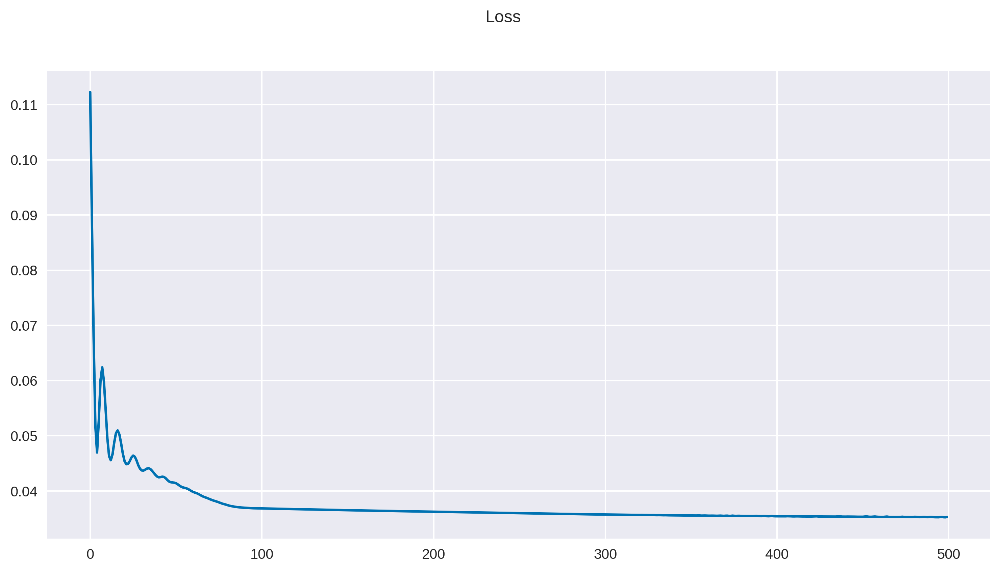

In [ ]:
var_list = ['Volatility', 'egarch_vol','egarch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm = LSTM(num_classes, input_size, hidden_size, num_layers)
criterion = torch.nn.L1Loss()    #mean-squared error
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm.train()
for epoch in range(num_epochs):
    outputs = lstm(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

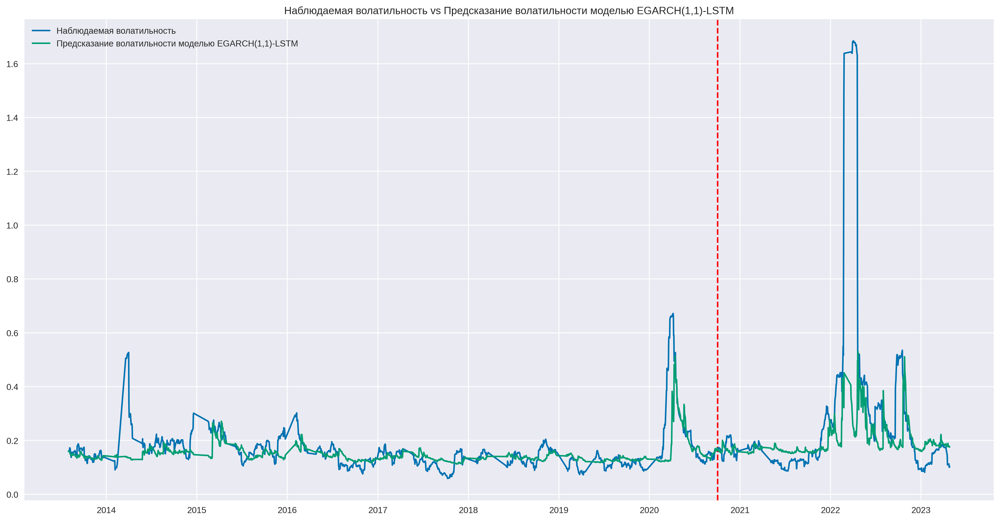

In [ ]:
lstm.eval()
train_predict = lstm(dataX)

data_predict_egarch = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_egarch, label = 'Предсказание волатильности моделью EGARCH(1,1)-LSTM')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью EGARCH(1,1)-LSTM')
plt.legend()
plt.show()

In [ ]:
table_9 = Error_stat(dataY_plot,data_predict_egarch,train_size)
table_9

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.112183,0.035288,0.057226
2,MSE,0.077063,0.004745,0.025377
3,RMSE,0.277602,0.068887,0.159303
4,HMAE,0.520089,0.245036,0.323509
5,HMSE,1.302791,0.236748,0.540889


In [ ]:
imoex['lstm_egarch_vol'] = data_predict_egarch
imoex

,Volatility,lstm_garch_vol,lstm_tgarch_vol,lstm_figarch_vol,lstm_egarch_vol
0,0.160701,0.156849,0.166046,0.153542,0.159688
1,0.159258,0.153457,0.163623,0.150064,0.158852
2,0.158622,0.150451,0.160117,0.146989,0.157784
3,0.172347,0.149431,0.158536,0.147225,0.156307
4,0.172116,0.146103,0.154564,0.142352,0.152222
...,...,...,...,...,...
2056,0.110916,0.174726,0.170264,0.187477,0.176451
2057,0.112594,0.171070,0.168538,0.185044,0.178142
2058,0.100063,0.170108,0.167410,0.184243,0.178577
2059,0.101756,0.170620,0.166857,0.183688,0.176391


Epoch: 0, loss: 0.28984
Epoch: 20, loss: 0.05297
Epoch: 40, loss: 0.04659
Epoch: 60, loss: 0.04441
Epoch: 80, loss: 0.04339
Epoch: 100, loss: 0.04243
Epoch: 120, loss: 0.04139
Epoch: 140, loss: 0.04020
Epoch: 160, loss: 0.03876
Epoch: 180, loss: 0.03740
Epoch: 200, loss: 0.03658
Epoch: 220, loss: 0.03636
Epoch: 240, loss: 0.03630
Epoch: 260, loss: 0.03626
Epoch: 280, loss: 0.03622
Epoch: 300, loss: 0.03617
Epoch: 320, loss: 0.03613
Epoch: 340, loss: 0.03608
Epoch: 360, loss: 0.03603
Epoch: 380, loss: 0.03599
Epoch: 400, loss: 0.03595
Epoch: 420, loss: 0.03591
Epoch: 440, loss: 0.03587
Epoch: 460, loss: 0.03582
Epoch: 480, loss: 0.03578


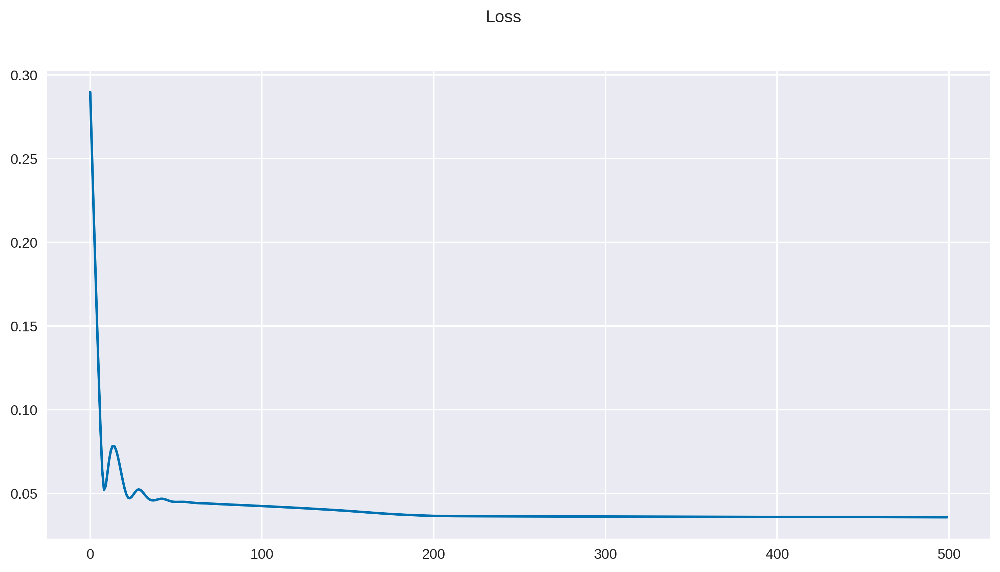

In [ ]:
var_list = ['Volatility', 'gjr_garch_vol','gjr_garch_resid']
seq_length = 22

dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)
num_epochs = 500
learning_rate = 0.01
input_size = len(var_list)
hidden_size = input_size
num_layers = 1
num_classes = 1

lstm = LSTM(num_classes, input_size, hidden_size, num_layers)
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(lstm.parameters(), lr=learning_rate)

loss_list = []


# Train the model
lstm.train()
for epoch in range(num_epochs):
    outputs = lstm(trainX)
    optimizer.zero_grad()

    # obtain the loss function
    loss = criterion(outputs, trainY)
    loss_list.append(loss.item())
    loss.backward()

    optimizer.step()
    if epoch % 20 == 0:
        print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

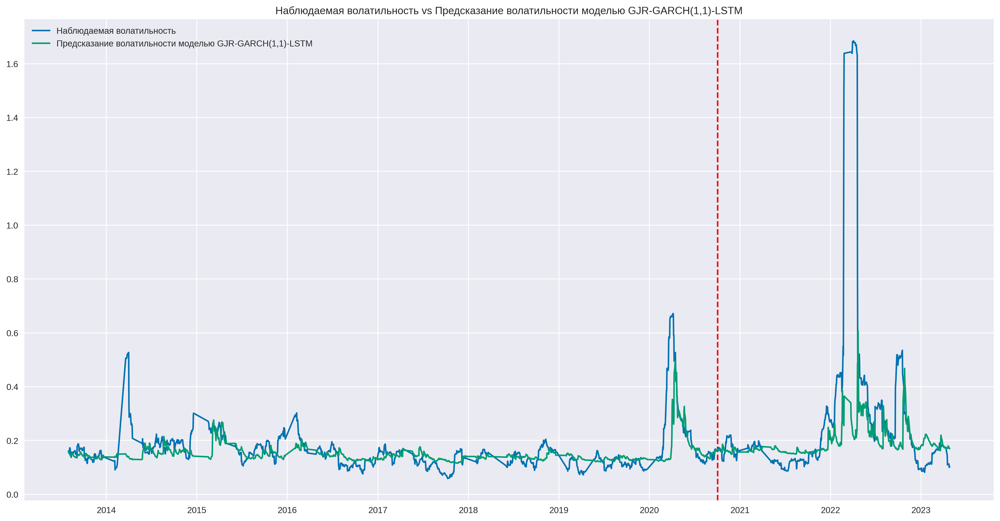

In [ ]:
lstm.eval()
train_predict = lstm(dataX)

data_predict_gjr_garch = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')

plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_gjr_garch, label = 'Предсказание волатильности моделью GJR-GARCH(1,1)-LSTM')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью GJR-GARCH(1,1)-LSTM')
plt.legend()
plt.show()

In [ ]:
table_10 = Error_stat(dataY_plot,data_predict_gjr_garch,train_size)
table_10

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.113302,0.035727,0.057859
2,MSE,0.080628,0.004825,0.026451
3,RMSE,0.283951,0.069459,0.162638
4,HMAE,0.544542,0.245479,0.330801
5,HMSE,1.587979,0.228012,0.616009


In [ ]:
imoex['lstm_gjr_garch_vol'] = data_predict_gjr_garch
imoex

,Volatility,lstm_garch_vol,lstm_tgarch_vol,lstm_figarch_vol,lstm_egarch_vol,lstm_gjr_garch_vol
0,0.160701,0.156849,0.166046,0.153542,0.159688,0.157910
1,0.159258,0.153457,0.163623,0.150064,0.158852,0.154080
2,0.158622,0.150451,0.160117,0.146989,0.157784,0.150457
3,0.172347,0.149431,0.158536,0.147225,0.156307,0.149421
4,0.172116,0.146103,0.154564,0.142352,0.152222,0.147003
...,...,...,...,...,...,...
2056,0.110916,0.174726,0.170264,0.187477,0.176451,0.179515
2057,0.112594,0.171070,0.168538,0.185044,0.178142,0.174692
2058,0.100063,0.170108,0.167410,0.184243,0.178577,0.171742
2059,0.101756,0.170620,0.166857,0.183688,0.176391,0.170381


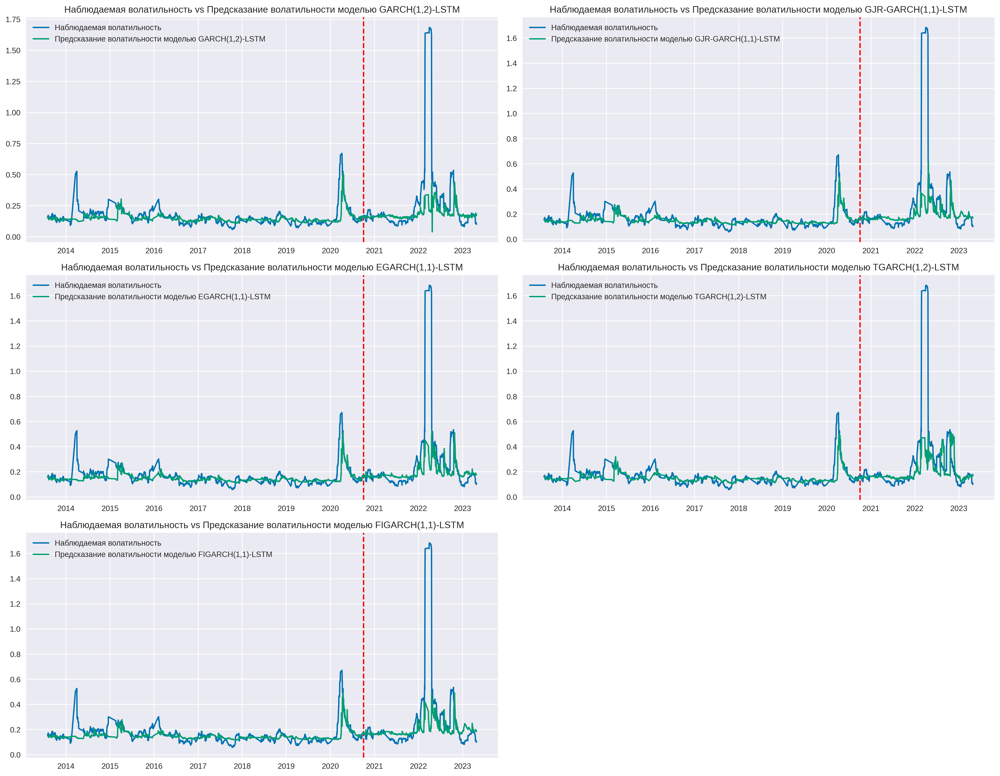

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(18,14))

axs[0, 0].axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
axs[0, 0].plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
axs[0, 0].plot(imoex_daily[44:].index, data_predict_garch, label = 'Предсказание волатильности моделью GARCH(1,2)-LSTM')
axs[0, 0].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью GARCH(1,2)-LSTM")
axs[0, 0].legend()

axs[0, 1].axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
axs[0, 1].plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
axs[0, 1].plot(imoex_daily[44:].index, data_predict_gjr_garch, label = 'Предсказание волатильности моделью GJR-GARCH(1,1)-LSTM')
axs[0, 1].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью GJR-GARCH(1,1)-LSTM")
axs[0, 1].legend()

axs[1, 0].axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
axs[1, 0].plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
axs[1, 0].plot(imoex_daily[44:].index, data_predict_egarch, label = 'Предсказание волатильности моделью EGARCH(1,1)-LSTM')
axs[1, 0].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью EGARCH(1,1)-LSTM")
axs[1, 0].legend()

axs[1, 1].axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
axs[1, 1].plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
axs[1, 1].plot(imoex_daily[44:].index, data_predict_tgarch, label = 'Предсказание волатильности моделью TGARCH(1,2)-LSTM')
axs[1, 1].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью TGARCH(1,2)-LSTM")
axs[1, 1].legend()

axs[2, 0].axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
axs[2, 0].plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
axs[2, 0].plot(imoex_daily[44:].index, data_predict_figarch, label = 'Предсказание волатильности моделью FIGARCH(1,1)-LSTM')
axs[2, 0].set_title("Наблюдаемая волатильность vs Предсказание волатильности моделью FIGARCH(1,1)-LSTM")
axs[2, 0].legend()

axs[2, 1].set_visible(False)


plt.tight_layout()
plt.savefig('all_garch_lstm.png')
plt.show()

Теперь построим модель, где мы обучаем разные GARCH модели, затем для каждого выхода модели LSTM и объединяем предсказания с помощью простой нейронной сети

In [ ]:
class ResBlock(nn.Module):
    def __init__(
        self,
        hidden_size: int,
        use_dropout: bool = False,
        dropout_prob: float = 0.05,
        use_batchnorm: bool = False
    ) -> None:
        """
        Does the following transformation:
        x -> x + F(x), where
        F(x) = Linear -> ReLU -> Dropout -> BatchNorm -> Linear

        :param hidden_size:
        :param use_dropout:
        :param dropout_prob:
        :param use_batchnorm:
        """
        super().__init__()

        self.use_dropout = use_dropout
        self.use_batchnorm = use_batchnorm

        self.layers = []
        self.layers.append(nn.Linear(hidden_size, hidden_size))
        self.layers.append(nn.ReLU())

        if use_dropout:
            self.layers.append(nn.Dropout(dropout_prob))
        if use_batchnorm:
            self.layers.append(nn.BatchNorm1d(hidden_size))
        self.layers.append(nn.Linear(hidden_size, hidden_size))

        self.layers = nn.Sequential(*self.layers)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = inputs
        residual = self.layers(inputs)
        return x + residual


class ResNet(nn.Module):
    def __init__(
        self,
        input_size: int,
        hidden_size: int,
        output_size: int = 1,
        num_blocks: int = 1
    ) -> None:
        """
        Contains num_blocks of ResBlocks

        :param input_size:
        :param hidden_size:
        :param output_size:
        :param num_blocks:
        """

        super().__init__()

        self.linear_start = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()

        self.blocks = nn.ModuleList()
        self.num_blocks = num_blocks

        for _ in range(num_blocks):
            self.blocks.append(ResBlock(hidden_size, use_batchnorm = True, use_dropout = False))

        self.linear_end = nn.Linear(hidden_size, output_size)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = self.relu(self.linear_start(inputs))

        for block_index in range(self.num_blocks):
            x = self.blocks[block_index](x)

        x = self.linear_end(x)

        return x

In [ ]:
var_list = ['Volatility', 'garch_vol','garch_resid', 'gjr_garch_vol','gjr_garch_resid', 'egarch_vol','egarch_resid', 'tgarch_vol','tgarch_resid', 'figarch_vol','figarch_resid']
seq_length = 22
dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)

In [ ]:
class BigModel(nn.Module):
    def __init__(self, num_garches, head_type):
        super().__init__()
        self.head_type = head_type
        self.lstms = nn.ModuleList()
        self.num_garches = num_garches

        for _ in range(num_garches):
          self.lstms.append(LSTM(num_classes = 1, input_size = 3, hidden_size = input_size, num_layers = 1))

        if head_type == 'ResNet':
          self.head = ResNet(input_size = num_garches, hidden_size = 2, num_blocks = 2)
        elif head_type == 'MLP':
          self.head = Net(input_size = num_garches, hidden_size = 3)


    def forward(self, x):
      for i, lstm in enumerate(self.lstms):
         if i == 0:
           slice_train = x[:, :, [0,i+1,i+2]]
           predictions = lstm(slice_train)
         else:
           j = i * 2
           slice_train = x[:, :, [0,j+1,j+2]]
           predictions = torch.cat((predictions, lstm(slice_train)), 1)
      out = self.head(predictions)
      return out

Epoch: 0, loss: 0.18272
Epoch: 20, loss: 0.04453
Epoch: 40, loss: 0.04138
Epoch: 60, loss: 0.03871
Epoch: 80, loss: 0.03742
Epoch: 100, loss: 0.03654
Epoch: 120, loss: 0.03605
Epoch: 140, loss: 0.03569
Epoch: 160, loss: 0.03536
Epoch: 180, loss: 0.03511
Epoch: 200, loss: 0.03490
Epoch: 220, loss: 0.03474
Epoch: 240, loss: 0.03455
Epoch: 260, loss: 0.03437
Epoch: 280, loss: 0.03432
Epoch: 300, loss: 0.03417
Epoch: 320, loss: 0.03396
Epoch: 340, loss: 0.03385
Epoch: 360, loss: 0.03373
Epoch: 380, loss: 0.03356
Epoch: 400, loss: 0.03350
Epoch: 420, loss: 0.03307
Epoch: 440, loss: 0.03272
Epoch: 460, loss: 0.03240
Epoch: 480, loss: 0.03170


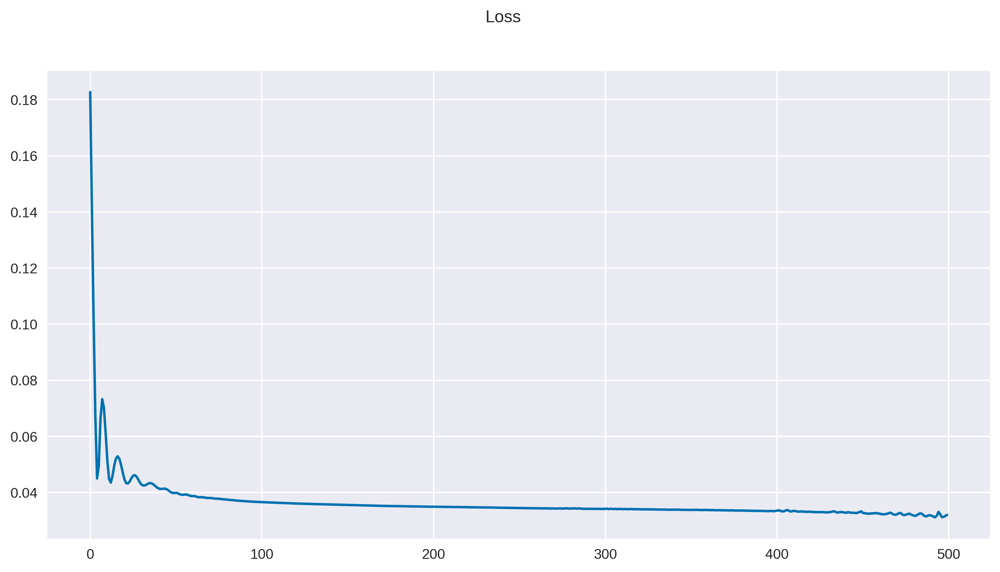

In [ ]:
num_epochs = 500
learning_rate = 0.01

final_model = BigModel(num_garches = 5, head_type = 'MLP')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(final_model.parameters(), lr=learning_rate)
loss_list = []


# Train the model
final_model.train()
for epoch in range(num_epochs):
  outputs = final_model(trainX)
  optimizer.zero_grad()

    # obtain the loss function
  loss = criterion(outputs, trainY)
  loss_list.append(loss.item())
  loss.backward()

  optimizer.step()
  if epoch % 20 == 0:
    print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

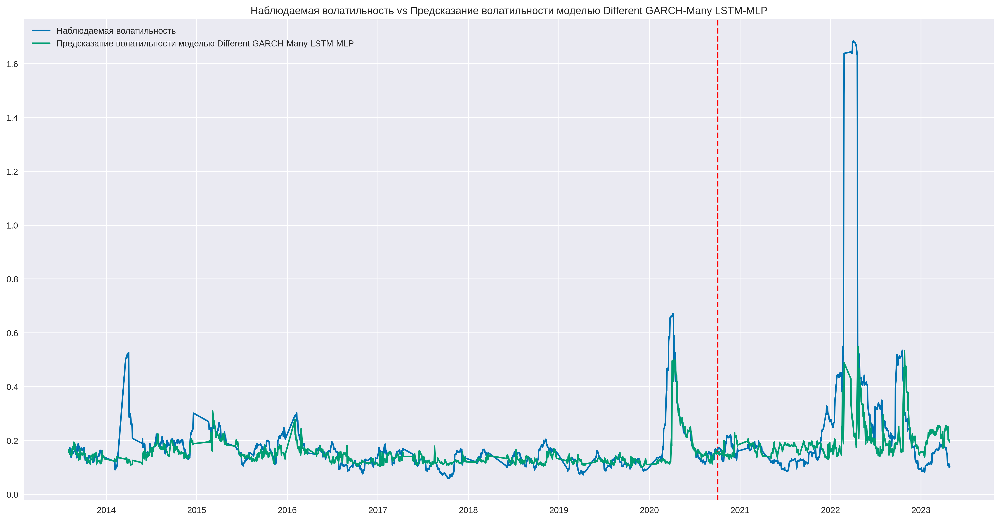

In [ ]:
final_model.eval()
train_predict = final_model(dataX)

data_predict_all_garch_2 = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_2, label = 'Предсказание волатильности моделью Different GARCH-Many LSTM-MLP')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью Different GARCH-Many LSTM-MLP')
plt.legend()
plt.savefig('all_garch_many_lstm_mlp.png')
plt.show()

In [ ]:
table_11 = Error_stat(dataY_plot,data_predict_all_garch_2,train_size)
table_11

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.130397,0.031142,0.059459
2,MSE,0.080637,0.00428,0.026064
3,RMSE,0.283967,0.06542,0.161445
4,HMAE,0.635023,0.229184,0.344969
5,HMSE,1.558659,0.260256,0.630688


Теперь построим модель, где мы обучаем разные GARCH модели, затем для каждого выхода модели LSTM и объединяем предсказания с помощью ResNet

In [ ]:
class ResBlock(nn.Module):
    def __init__(
        self,
        hidden_size: int,
        use_dropout: bool = False,
        dropout_prob: float = 0.05,
        use_batchnorm: bool = False
    ) -> None:
        """
        Does the following transformation:
        x -> x + F(x), where
        F(x) = Linear -> ReLU -> Dropout -> BatchNorm -> Linear

        :param hidden_size:
        :param use_dropout:
        :param dropout_prob:
        :param use_batchnorm:
        """
        super().__init__()

        self.use_dropout = use_dropout
        self.use_batchnorm = use_batchnorm

        self.layers = []
        self.layers.append(nn.Linear(hidden_size, hidden_size))
        self.layers.append(nn.ReLU())

        if use_dropout:
            self.layers.append(nn.Dropout(dropout_prob))
        if use_batchnorm:
            self.layers.append(nn.BatchNorm1d(hidden_size))
        self.layers.append(nn.Linear(hidden_size, hidden_size))

        self.layers = nn.Sequential(*self.layers)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = inputs
        residual = self.layers(inputs)
        return x + residual


class ResNet(nn.Module):
    def __init__(
        self,
        input_size: int,
        hidden_size: int,
        output_size: int = 1,
        num_blocks: int = 1
    ) -> None:
        """
        Contains num_blocks of ResBlocks

        :param input_size:
        :param hidden_size:
        :param output_size:
        :param num_blocks:
        """

        super().__init__()

        self.linear_start = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()

        self.blocks = nn.ModuleList()
        self.num_blocks = num_blocks

        for _ in range(num_blocks):
            self.blocks.append(ResBlock(hidden_size, use_batchnorm = True, use_dropout = True))

        self.linear_end = nn.Linear(hidden_size, output_size)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        x = self.relu(self.linear_start(inputs))

        for block_index in range(self.num_blocks):
            x = self.blocks[block_index](x)

        x = self.linear_end(x)

        return x

In [ ]:
class LSTM(nn.Module):
    def __init__(self, num_classes, input_size, hidden_size, num_layers, head_type = 'FC'):
        super(LSTM, self).__init__()

        self.num_classes = num_classes
        self.num_layers = num_layers
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.seq_length = seq_length
        self.head_type = head_type

        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True)

        if head_type == 'FC':
          self.head = nn.Linear(hidden_size, num_classes)
        elif head_type == 'ResNet':
          self.head = ResNet(input_size = hidden_size, hidden_size = 3, num_blocks = 2)
        elif head_type == 'MLP':
          self.head = Net(hidden_size, 1)


    def forward(self, x):

        h_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))

        c_0 = Variable(torch.zeros(
            self.num_layers, x.size(0), self.hidden_size))

        # Propagate input through LSTM
        ula, (h_out, _) = self.lstm(x, (h_0, c_0))

        h_out = h_out.view(-1, self.hidden_size)

        if self.head_type == 'FC':
          out = self.head(h_out)
        else:
          out = self.head.forward(h_out)

        return out

Epoch: 0, loss: 0.43603
Epoch: 20, loss: 0.06829
Epoch: 40, loss: 0.04911
Epoch: 60, loss: 0.03889
Epoch: 80, loss: 0.03766
Epoch: 100, loss: 0.03713
Epoch: 120, loss: 0.03672
Epoch: 140, loss: 0.03630
Epoch: 160, loss: 0.03551
Epoch: 180, loss: 0.03495
Epoch: 200, loss: 0.03481
Epoch: 220, loss: 0.03458
Epoch: 240, loss: 0.03409
Epoch: 260, loss: 0.03389
Epoch: 280, loss: 0.03346
Epoch: 300, loss: 0.03341
Epoch: 320, loss: 0.03302
Epoch: 340, loss: 0.03255
Epoch: 360, loss: 0.03243
Epoch: 380, loss: 0.03210
Epoch: 400, loss: 0.03179
Epoch: 420, loss: 0.03161
Epoch: 440, loss: 0.03176
Epoch: 460, loss: 0.03091
Epoch: 480, loss: 0.03082


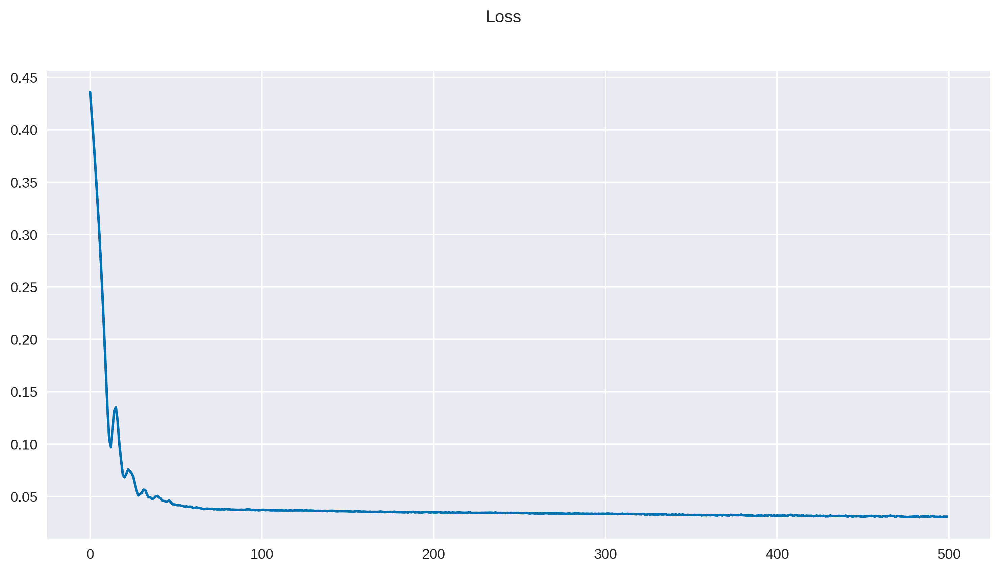

In [ ]:
num_epochs = 500
learning_rate = 0.01

final_model = BigModel(num_garches = 5, head_type = 'ResNet')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(final_model.parameters(), lr=learning_rate)
loss_list = []


# Train the model
final_model.train()
for epoch in range(num_epochs):
  outputs = final_model(trainX)
  optimizer.zero_grad()

    # obtain the loss function
  loss = criterion(outputs, trainY)
  loss_list.append(loss.item())
  loss.backward()

  optimizer.step()
  if epoch % 20 == 0:
    print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

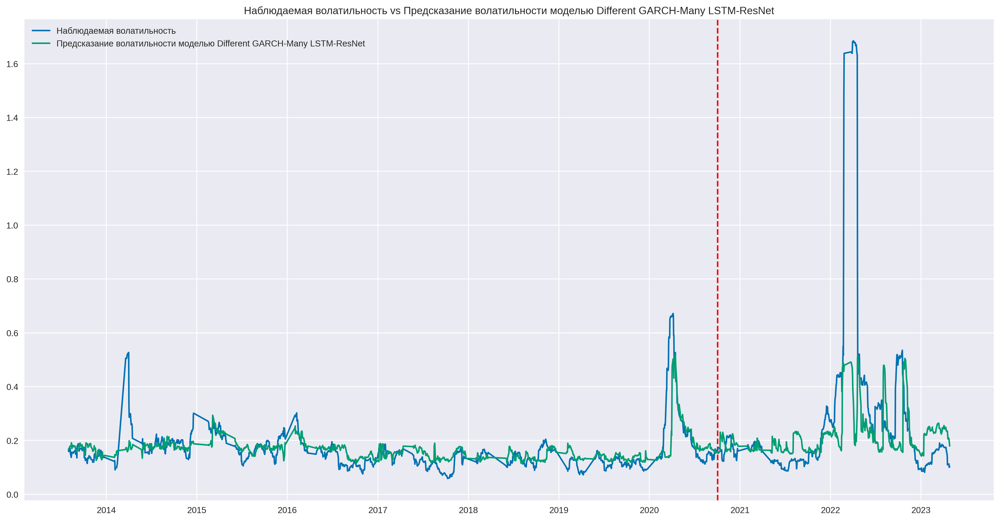

In [ ]:
final_model.eval()
train_predict = final_model(dataX)

data_predict_all_garch_3 = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_3, label = 'Предсказание волатильности моделью Different GARCH-Many LSTM-ResNet')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью Different GARCH-Many LSTM-ResNet')
plt.legend()
plt.savefig('all_garch_many_lstm_resnet.png')
plt.show()

In [ ]:
table_12 = Error_stat(dataY_plot,data_predict_all_garch_3,train_size)
table_12

,0,1,2,3
0,,Test,Train,Overall
1,MAE,0.123976,0.033371,0.059221
2,MSE,0.074214,0.003884,0.023949
3,RMSE,0.272422,0.062326,0.154756
4,HMAE,0.540808,0.209245,0.30384
5,HMSE,1.220481,0.158366,0.461386


In [ ]:
var_list = ['Volatility', 'garch_vol', 'gjr_garch_vol','egarch_vol','tgarch_vol','figarch_vol']
seq_length = 22
dataX,dataY,trainX,trainY,testX,testY = data_prepare(imoex_daily, var_list, seq_length, train_size)

In [ ]:
class BigModel(nn.Module):
    def __init__(self, num_garches, head_type):
        super().__init__()
        self.head_type = head_type
        self.lstms = nn.ModuleList()
        self.num_garches = num_garches

        for _ in range(num_garches):
          self.lstms.append(LSTM(num_classes = 1, input_size = 2, hidden_size = input_size, num_layers = 1))

        if head_type == 'ResNet':
          self.head = ResNet(input_size = num_garches, hidden_size = 2, num_blocks = 2)
        elif head_type == 'MLP':
          self.head = Net(input_size = num_garches, hidden_size = 3)


    def forward(self, x):
      for i, lstm in enumerate(self.lstms):
         slice_train = x[:, :, [0,i+1]]
         if i == 0:
           predictions = lstm(slice_train)
         else:
           predictions = torch.cat((predictions, lstm(slice_train)), 1)
      out = self.head(predictions)
      return out

Epoch: 0, loss: 0.09599
Epoch: 20, loss: 0.03940
Epoch: 40, loss: 0.03832
Epoch: 60, loss: 0.03767
Epoch: 80, loss: 0.03749
Epoch: 100, loss: 0.03751
Epoch: 120, loss: 0.03736
Epoch: 140, loss: 0.03726
Epoch: 160, loss: 0.03704
Epoch: 180, loss: 0.03635
Epoch: 200, loss: 0.03641
Epoch: 220, loss: 0.03579
Epoch: 240, loss: 0.03547
Epoch: 260, loss: 0.03492
Epoch: 280, loss: 0.03497
Epoch: 300, loss: 0.03399
Epoch: 320, loss: 0.03421
Epoch: 340, loss: 0.03418
Epoch: 360, loss: 0.03330
Epoch: 380, loss: 0.03319
Epoch: 400, loss: 0.03405
Epoch: 420, loss: 0.03437
Epoch: 440, loss: 0.03330


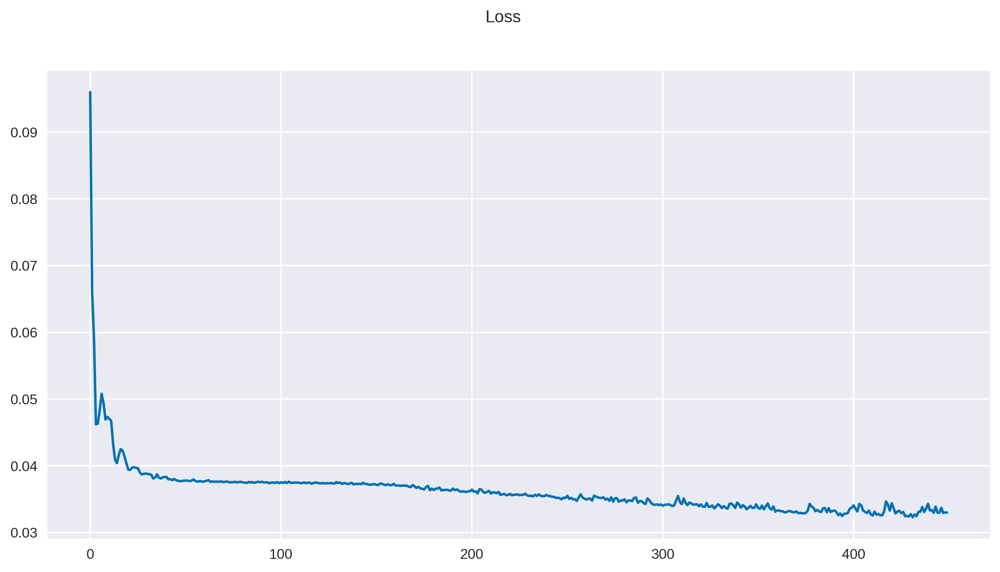

In [ ]:
um_epochs = 500
learning_rate = 0.01

final_model_2 = BigModel(num_garches = 5, head_type = 'ResNet')
criterion = torch.nn.L1Loss()
optimizer = torch.optim.Adam(final_model_2.parameters(), lr=learning_rate)
loss_list = []


# Train the model
final_model_2.train()
for epoch in range(num_epochs):
  outputs = final_model_2(trainX)
  optimizer.zero_grad()

    # obtain the loss function
  loss = criterion(outputs, trainY)
  loss_list.append(loss.item())
  loss.backward()

  optimizer.step()
  if epoch % 20 == 0:
    print("Epoch: %d, loss: %1.5f" % (epoch, loss.item()))

plt.plot(loss_list)
plt.suptitle('Loss')
plt.show()

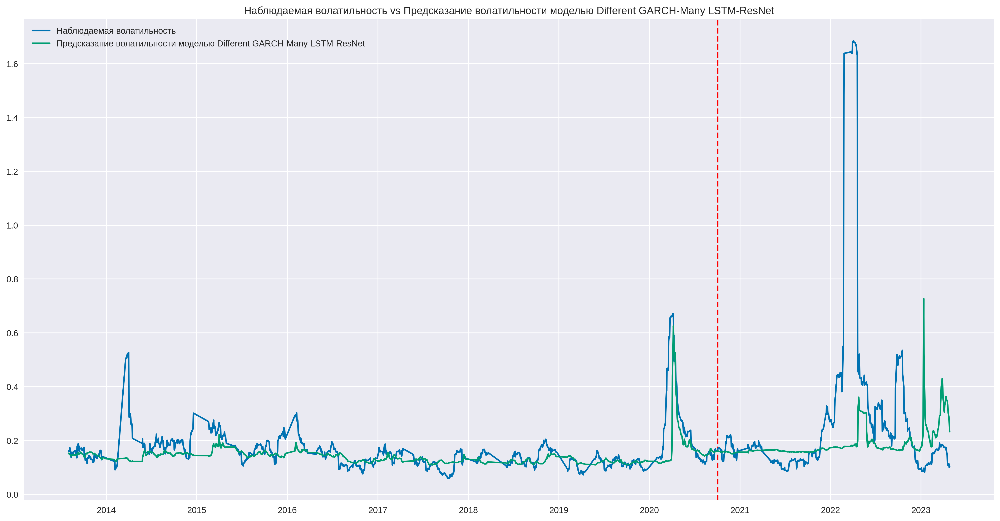

In [ ]:
final_model_2.eval()
train_predict = final_model_2(dataX)

data_predict_all_garch_3 = train_predict.data.numpy()
dataY_plot = dataY.data.numpy()

plt.figure(figsize=(20,10))
plt.axvline(x=imoex_daily[44:].iloc[[train_size]].index, c='r', linestyle='--')
plt.plot(imoex_daily[44:].index, dataY_plot, label = 'Наблюдаемая волатильность')
plt.plot(imoex_daily[44:].index, data_predict_all_garch_3, label = 'Предсказание волатильности моделью Different GARCH-Many LSTM-ResNet')
plt.title('Наблюдаемая волатильность vs Предсказание волатильности моделью Different GARCH-Many LSTM-ResNet')
plt.legend()
plt.savefig('all_garch_many_lstm_resnet.png')
plt.show()

In [ ]:
# Use the training data for deep explainer => can use fewer instances
explainer = shap.DeepExplainer(final_model_2, trainX)
# explain the the testing instances (can use fewer instanaces)
# explaining each prediction requires 2 * background dataset size runs
shap_values = explainer.shap_values(testX)
# init the JS visualization code
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list)

In [ ]:
shap.force_plot(explainer.expected_value[0], shap_values[0][0], var_list,show=False,matplotlib=True).savefig("shap_3.png")